# GEO-Bench Exploratory Data Analysis

## Overview

GEO-Bench is a General Earth Observation benchmark for evaluating the performances of large pre-trained models on geospatial data. <br>
It comprises:
- 6 datasets for **classification** tasks;
- 6 datasets for **segmentation** tasks.

All of which were carefully curated and adapted to be both relevant to the field and well-suited for model evaluation.<br>

In this notebook, we explore the six datasets meant for the <u>classification</u> task.

The datasets have different characteristics in terms of image size, number of classes, resolution, and spectral bands available as shown in the table below taken from the original paper.

<img src='https://drive.google.com/uc?id=1L4jm3KG5Lo3e3jQ1XjvusKjdsjgrAWe5' width=800>

**Spectral Bands**

The images found in the bechmark also comprise different **spectral bands**: these are specific ranges of wavelengths on the spectrum. Different spectral bands apply to different use cases, so it's important to understand what right data to select. Optical imagery in the visible region typically spans the wavelengths from 400 to 800 nm, while in the infrared region goes from 800 to 14,500 nm. Some of the most relevant spectral bands:

- **Aerosols**: wavelength $\sim 400-450 \,\text{nm}$, mostly used in atmospheric correction, coastal and water body studies;
- **Blue**: wavelength $\sim 450-510 \,\text{nm}$, part of the RGB visualization;
- **Green**: wavelength $\sim 500-600 \,\text{nm}$, part of the RGB visualization;
- **Red**: wavelength $\sim 600-700 \,\text{nm}$, part of the RGB visualization. RGB bands are usually used for land cover classification and change detection, urban and infrastructure monitoring and vegetation and crop observation;
- **Vegetation Red Edge 1, 2, 3, 4**: wavelengths between $\sim 690-740 \,\text{nm}$, these bands are typically used for vegetative health and biodiversity monitoring or ecological analysis;
- **Near-Infrared (NIR)**: wavelength $\sim 800-1000 \,\text{nm}$, just beyond visible red light on the electromagnetic spectrum, sensitive to water and vegetative surface reflectance. This band is used for water and water vapor detection, vegetative health monitoring and spectral indexes (NDVI, EVI, and NBR) where it's typically combined or bundled with RGB and other bands.
- **Water vapour**: wavelength $\sim 940 \,\text{nm}$, water vapour pressure represents the height the water would occupy if the vapor were condensed into liquid and spread evenly across the column. It is used in atmospheric correction, cloud detection, and water vapor concentration analysis.

- **Short-Wave Infrared (SWIR) 1 and 2**: wavelengths between $\sim 1000-2500 \,\text{nm}$, provides information about material composition and surface characteristics. It can penetrate atmospheric effects like haze and moisture, and is useful for studying the Earth's surface. It is used for infrastructure monitoring, soil composition analysis and mineral identification plus NBR index.

**True color and False color composites**

RGB bands are the only visible bands to us and thus they're used to create true-color and false-color imagery:

- In *true-color* imagery, the colors in the image closely resemble the natural colors of the objects as seen by the human eye.
- In *false-color* imagery, the colors assigned to the different bands aren't representative of the natural colors of the objects. Because other multispectral bands fall outside the visible spectrum, the choice of bands highlights specific features that aren't distinguishable in true-color imagery.
  There can be several false-color displays, depending on which combination of bands is chosen. The most common visualization combines red, green, and NIR bands. It displays the red band in green, the green band in blue, and the NIR band in red.


Sources:

- https://docs.up42.com/data/reference/spectral-bands#:~:text=Optical%20sensors%20capture%20light%20across,understand%20the%20different%20spectral%20bands.

- https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_SR_HARMONIZED#bands

**Note on the HDF5 File Format**

The GEO-Bench images are provided as `.hdf5` files. This stands for **Hierarchical Data Format version 5 (HDF5)** and is a file format used to store large amounts of data in a structured way. It's commonly used for storing datasets that can be too large to fit in memory and supports large, complex data structures like arrays, tables, and images. For more details:
- https://stackoverflow.com/questions/28170623/how-to-read-hdf5-files-in-python
- https://docs.h5py.org/en/latest/quick.html
- https://docs.h5py.org/en/stable/high/dataset.html

**Note on the Geo-Bench Task Specifications Object**

Each dataset is accompanied by a TaskSpecifications object describing the schema of a particular dataset without having to load any samples. It contains the dataset name, the type of labels, the BandInfo of each band and their shapes. The aim of this data structure is to let users procedurally generate a machine learning model that is suitable for the given dataset at the beginning of the training. Installing geobench with `!pip install geobench` is required to be able to open this file.
```
'''
Args:
    dataset_name: The name of the dataset.
    bands_info: band info
    spatial_resolution: physical distance between pixels in meters.
    benchmark_name: The name of the benchmark used. Defaults to "converted".
    patch_size: maximum image patch size across bands (width, height).
    n_time_steps: integer specifying the number of time steps for each sample.
        This should be 1 for most dataset unless it's time series.
    bands_info: list of object of type BandInfo describing the type of each band.
    label_type: The type of the label e.g. Classification, SegmentationClasses, Regression.
'''
```

## Libraries

In [1]:
%%capture
# Install geobench to access data
!pip install geobench

In [2]:
%%capture
# geobench uses older versions of numpy and pandas
# Necessary to re-install these two before importing libraries
!pip uninstall -y pandas numpy
!pip install "numpy<2.0.0" "pandas<2.0.0,>=1.5.3"

> **Note**: need to <u>restart runtime session</u> before running the following cell!

In [1]:
# Load libraries
import geobench
import numpy as np
import pandas as pd
import os
from matplotlib import pyplot as plt
import seaborn as sns
from PIL import Image
import random

import h5py
import json
import pickle
from pathlib import Path

# Ignore warning
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Mount the google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---

<br>

**PRINT DATASET INFORMATION USING THEIR FUNCTIONS**

Loading dataset description via automatic function plus running some tests

In [ ]:
import os

os.environ["GEO_BENCH_DIR"] = "/content/drive/MyDrive/Thesis CLIP4EO/home"
print(os.environ.get("GEO_BENCH_DIR")) # !echo $GEO_BENCH_DIR

/content/drive/MyDrive/Thesis CLIP4EO/home


In [ ]:
### Do NOT run again ###
#!geobench-download

.gitattributes: 100% 3.23k/3.23k [00:00<00:00, 11.6MB/s]
README.md: 100% 86.0/86.0 [00:00<00:00, 275kB/s]
m-bigearthnet.zip: 100% 6.56G/6.56G [03:58<00:00, 27.5MB/s]
m-brick-kiln.zip: 100% 1.58G/1.58G [00:57<00:00, 27.8MB/s]
m-eurosat.zip: 100% 276M/276M [00:10<00:00, 27.1MB/s]
m-forestnet.zip: 100% 1.92G/1.92G [01:09<00:00, 27.6MB/s]
m-pv4ger.zip: 100% 1.03G/1.03G [00:37<00:00, 27.4MB/s]
m-so2sat.zip: 100% 964M/964M [00:34<00:00, 27.9MB/s]
normalizer.json: 100% 423/423 [00:00<00:00, 1.81MB/s]
m-NeonTree.zip: 100% 601M/601M [00:21<00:00, 27.4MB/s]
m-SA-crop-type.zip: 100% 1.43G/1.43G [00:52<00:00, 27.4MB/s]
m-cashew-plant.zip: 100% 1.33G/1.33G [00:48<00:00, 27.7MB/s]
m-chesapeake.zip: 100% 1.25G/1.25G [00:44<00:00, 28.2MB/s]
m-nz-cattle.zip: 100% 327M/327M [00:11<00:00, 27.8MB/s]
m-pv4ger-seg.zip: 100% 300M/300M [00:14<00:00, 20.0MB/s]
normalizer.json: 100% 434/434 [00:00<00:00, 1.27MB/s]
Decompressing 1/12: classification_v1.0/m-bigearthnet.zip  ...
Extracting m-bigearthnet.zip: 100% 

In [ ]:
# Example load datasets
import geobench

print("geobench dir:", geobench.GEO_BENCH_DIR)

for benchmark_name in ("classification_v1.0", "segmentation_v1.0"):
    print(f"Benchmark {benchmark_name}:\n")
    for task in geobench.task_iterator(benchmark_name=benchmark_name):
        print(f"Task {task.dataset_name}:\n  {task}\n")

        dataset = task.get_dataset(split="train")
        sample = dataset[0]

        print(f"Sample 0 named: {sample.sample_name}")
        for band in sample.bands:
            print(f"  {band.band_info.name}: {band.data.shape}")

        print("========================================\n")

geobench dir: /content/drive/MyDrive/Thesis CLIP4EO/home
Benchmark classification_v1.0:

Task m-bigearthnet:
  classification_v1.0/m-bigearthnet
  12 bands, max shape 120x120 @ 10m resolution.

Sample 0 named: id_16356
  01 - Coastal aerosol: (120, 120)
  02 - Blue: (120, 120)
  03 - Green: (120, 120)
  04 - Red: (120, 120)
  05 - Vegetation Red Edge: (120, 120)
  06 - Vegetation Red Edge: (120, 120)
  07 - Vegetation Red Edge: (120, 120)
  08 - NIR: (120, 120)
  08A - Vegetation Red Edge: (120, 120)
  09 - Water vapour: (120, 120)
  11 - SWIR: (120, 120)
  12 - SWIR: (120, 120)

Task m-brick-kiln:
  classification_v1.0/m-brick-kiln
  13 bands, max shape 64x64 @ 10m resolution.

Sample 0 named: examples_75_67
  01 - Coastal aerosol: (64, 64)
  02 - Blue: (64, 64)
  03 - Green: (64, 64)
  04 - Red: (64, 64)
  05 - Vegetation Red Edge: (64, 64)
  06 - Vegetation Red Edge: (64, 64)
  07 - Vegetation Red Edge: (64, 64)
  08 - NIR: (64, 64)
  08A - Vegetation Red Edge: (64, 64)
  09 - Water

In [ ]:
!pip install pytest

In [ ]:
!geobench-test

======================================= test session starts ========================================
platform linux -- Python 3.11.11, pytest-8.3.5, pluggy-1.5.0
rootdir: /usr/local/lib/python3.11/dist-packages/geobench/tests
plugins: typeguard-4.4.2, anyio-4.9.0, langsmith-0.3.23
collected 8 items                                                                                  

../usr/local/lib/python3.11/dist-packages/geobench/tests/test_dataset.py .......             [ 87%]
../usr/local/lib/python3.11/dist-packages/geobench/tests/test_example_load_dataset.py .      [100%]

======================================== 8 passed in 3.58s =========================================


---

## Utility functions

Reminder of how the indexes work for plots on a grid with `plt.subplots()`:

<img src = 'https://matplotlib.org/stable/_images/users-explain-axes-index-1.2x.png' width = 450>



In [ ]:
def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))


def plot_random_images(images_path, seed, rgb_bands, true_labels, labels = False):

    ''' Plot 15 sample images from the dataset on a grid. '''

    images = [path for path in os.listdir(images_path) if '.hdf5' in path]

    random.seed(seed)
    random_images = random.sample(images, 15)

    fig, axes = plt.subplots(3, 5, figsize = (17, 10))
    axes = axes.flatten()
    for i, image_id in enumerate(random_images):
        filename = os.path.join(images_path, image_id)
        with h5py.File(filename, 'r') as f:
            r = f[rgb_bands[0]][:]
            g = f[rgb_bands[1]][:]
            b = f[rgb_bands[2]][:]
            true_color = np.stack([r, g, b], axis=-1)
        true_color = normalize(true_color)
        axes[i].imshow(true_color)
        axes[i].set_title(image_id)
        axes[i].axis("off")
        if labels: # NOT for multilabel, only multiclass
            axes[i].text(0.05, -0.1, true_labels[labels[image_id]], transform = axes[i].transAxes,
                         ha = 'left', va = 'bottom', fontsize = 8, wrap = True)
    plt.suptitle("Sample images\n", fontsize = 20)
    plt.tight_layout()
    plt.show()

    return


def plot_true_vs_false_composite_image(hdf5_file, rgb_bands = ("04 - Red", "03 - Green", "02 - Blue"),
                                       false_color_1_bands = ("08 - NIR", "04 - Red", "03 - Green"),
                                       false_color_2_bands = ("11 - SWIR, 08 - NIR", "02 - Blue")):

    ''' Show a sample image with 1 true and 2 false color composites. '''

    # True Color (R-G-B)
    r = hdf5_file[rgb_bands[0]][:] # shape (120, 120)
    g = hdf5_file[rgb_bands[1]][:] # shape (120, 120)
    b = hdf5_file[rgb_bands[2]][:] # shape (120, 120)
    true_color = np.stack([r, g, b], axis=-1) # shape (120, 120, 3)

    # False Color 1 (NIR-R-G)
    nir = hdf5_file[false_color_1_bands[0]][:]
    r = hdf5_file[false_color_1_bands[1]][:]
    g = hdf5_file[false_color_1_bands[2]][:]
    false_color_1 = np.stack([nir, r, g], axis=-1) # shape (120, 120, 3)

    # False Color 2 (SWIR-1, NIR, B)
    swir1 = hdf5_file[false_color_1_bands[0]][:]
    false_color_2 = np.stack([swir1, nir, b], axis=-1) # shape (120, 120, 3)

    # Normalize images
    true_color = normalize(true_color)
    false_color_1 = normalize(false_color_1)
    false_color_2 = normalize(false_color_2)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize = (15, 5))
    axes[0].imshow(true_color)
    axes[0].set_title("True Color (RGB)")
    axes[0].axis("off")

    axes[1].imshow(false_color_1)
    axes[1].set_title("Color Infrared (NIR-R-G)")
    axes[1].axis("off")

    axes[2].imshow(false_color_2)
    axes[2].set_title("Agri RGB (SWIR-NIR-B)")
    axes[2].axis("off")

    plt.suptitle("True and False color composites\n", fontsize = 20)
    plt.tight_layout()
    plt.show()

    return


def plot_all_bands(hdf5_file):

    ''' Visualize independently all spectral bands of a hdf5 file. '''

    band_names = list(f.keys())
    num_bands = len(band_names)

    cols = 4
    rows = int(np.ceil(num_bands / cols)) # 3

    fig, axes = plt.subplots(rows, cols, figsize = (15, rows * 4))
    axes = axes.flatten()

    for i, band_name in enumerate(band_names):
        band_data = f[band_name][:]

        # Normalize to scale values in [0, 1] -> float image
        # (the range 0-255 is for integer images)
        band_data = normalize(band_data)

        # Plot single band
        axes[i].imshow(band_data, cmap = "gray")
        axes[i].set_title('\n' + band_name)
        axes[i].axis("off")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Available spectral bands\n", fontsize = 20)
    plt.tight_layout()
    plt.show()


def plot_images_multilabel(images_path, seed, image_labels, multilabels, rgb_bands = ["04 - Red", "03 - Green", "02 - Blue"]):

    ''' Plot 3 images from the dataset with attached multi-labels. '''

    images = [img for img in os.listdir(images_path) if '.hdf5' in img]

    random.seed(seed)
    random_images = random.sample(images, 3)

    fig, axes = plt.subplots(1, 3, figsize = (15, 5))
    axes = axes.flatten()
    for i, image_id in enumerate(random_images):
        filename = os.path.join(images_path, image_id)
        img_labels = image_labels[image_id[:-5]]

        with h5py.File(filename, "r") as f:
            r = f[rgb_bands[0]][:]
            g = f[rgb_bands[1]][:]
            b = f[rgb_bands[2]][:]
            true_color = np.stack([r, g, b], axis=-1)
        true_color = normalize(true_color)

        # construct labels
        labels = [label for boolean, label in zip(img_labels, multilabels) if boolean]
        label_text = "\n".join(f"- {l}" for l in labels)
        label_text = "Labels:\n" + label_text

        # plot image
        axes[i].imshow(true_color)
        axes[i].set_title(image_id)
        axes[i].axis("off")
        # add labels below image using figtext
        axes[i].text(0.05, -0.3, label_text, transform = axes[i].transAxes,
                ha = 'left', va = 'bottom', fontsize = 8, wrap = True)
        # the following shows the text for the overall figure instead of specific subplots
        #plt.figtext(0.05, -0.15, label_text, wrap = True, horizontalalignment = 'left', fontsize = 8)

    plt.suptitle("Sample images with labels\n", fontsize = 20)
    plt.tight_layout()
    plt.show()

    return

## Loading the data

Checking storage usage

In [ ]:
# Check storage usage
#!df -h
# List large files
#!du -h /content | sort -rh | head -20

The following code unzips all the datasets folders on Google Drive (just need to run it once)

In [ ]:
# Unzip classification datasets

# Folder 1 - DONE! (15 min)
#!unzip "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-bigearthnet.zip" -d "/content/drive/MyDrive/Thesis CLIP4EO/Geo-Bench classification data/"

# Folder 2 - DONE! (6 min)
#!unzip "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-brick-kiln.zip" -d "/content/drive/MyDrive/Thesis CLIP4EO/Geo-Bench classification data/"

# Folder 3 - DONE! (2 min)
#!unzip "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-eurosat.zip" -d "/content/drive/MyDrive/Thesis CLIP4EO/Geo-Bench classification data/"

# Folder 4 - DONE! (4 min)
#!unzip "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-forestnet.zip" -d "/content/drive/MyDrive/Thesis CLIP4EO/Geo-Bench classification data/"

# Folder 5 - DONE! (5 min)
#!unzip "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-pv4ger.zip" -d "/content/drive/MyDrive/Thesis CLIP4EO/Geo-Bench classification data/"

# Folder 6 - DONE! (6 min)
#!unzip "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-so2sat.zip" -d "/content/drive/MyDrive/Thesis CLIP4EO/Geo-Bench classification data/"

Getting path to the image folders and counting items:

In [3]:
# Setting data path
data_path = "/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/"
data_folders = [d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d))]
data_folders

['m-eurosat',
 'm-bigearthnet',
 'm-brick-kiln',
 'm-forestnet',
 'm-pv4ger',
 'm-so2sat']

In [4]:
# Checking datasets dimension
for data_folder in data_folders:
    # dataset
    print("Dataset:", data_folder)
    # number of images
    print("Size:", len(os.listdir(os.path.join(data_path + data_folder))))
    # train, valid and test partition (default)
    with open(os.path.join(data_path, data_folder, 'default_partition.json'), 'r') as file:
        data = json.load(file)
        print(list(data.keys()))
        print(len(data['train']), len(data['valid']), len(data['test']))
    # metadata files
    print("Metadata:", len([f for f in os.listdir(os.path.join(data_path + data_folder)) if '.hdf5' not in f]), "files")
    print()

Dataset: m-eurosat
Size: 4012
['train', 'valid', 'test']
2000 1000 1000
Metadata: 12 files

Dataset: m-bigearthnet
Size: 22013
['train', 'valid', 'test']
20000 1000 1000
Metadata: 13 files

Dataset: m-brick-kiln
Size: 17074
['train', 'valid', 'test']
15063 999 999
Metadata: 13 files

Dataset: m-forestnet
Size: 8459
['train', 'valid', 'test']
6464 989 993
Metadata: 13 files

Dataset: m-pv4ger
Size: 13825
['train', 'valid', 'test']
11814 999 999
Metadata: 13 files

Dataset: m-so2sat
Size: 21976
['train', 'valid', 'test']
19992 986 986
Metadata: 12 files



## Binary Classification

### 1) m-brick-kiln  

In [5]:
# Set images path and select sample image
images_folder = 'm-brick-kiln'
images_path = os.path.join(data_path, images_folder)
image_id = os.listdir(images_path)[0] # .hdf5 file
filename = os.path.join(images_path, image_id) # path to .hdf5 file

# Check the content of a .hdf5 file
f = h5py.File(filename, 'r')
print(type(f))
print(len(f.keys()), 'bands available')
list(f.keys())

<class 'h5py._hl.files.File'>
13 bands available


['01 - Coastal aerosol',
 '02 - Blue',
 '03 - Green',
 '04 - Red',
 '05 - Vegetation Red Edge',
 '06 - Vegetation Red Edge',
 '07 - Vegetation Red Edge',
 '08 - NIR',
 '08A - Vegetation Red Edge',
 '09 - Water vapour',
 '10 - SWIR - Cirrus',
 '11 - SWIR',
 '12 - SWIR']

In [6]:
# List all "datasets" (spectral bands) of this file
for key in f.keys():
    data = f[key]
    print(f"Dataset '{key}' shape: {data.shape} dtype: {data.dtype}")

Dataset '01 - Coastal aerosol' shape: (64, 64) dtype: float64
Dataset '02 - Blue' shape: (64, 64) dtype: float64
Dataset '03 - Green' shape: (64, 64) dtype: float64
Dataset '04 - Red' shape: (64, 64) dtype: float64
Dataset '05 - Vegetation Red Edge' shape: (64, 64) dtype: float64
Dataset '06 - Vegetation Red Edge' shape: (64, 64) dtype: float64
Dataset '07 - Vegetation Red Edge' shape: (64, 64) dtype: float64
Dataset '08 - NIR' shape: (64, 64) dtype: float64
Dataset '08A - Vegetation Red Edge' shape: (64, 64) dtype: float64
Dataset '09 - Water vapour' shape: (64, 64) dtype: float64
Dataset '10 - SWIR - Cirrus' shape: (64, 64) dtype: float64
Dataset '11 - SWIR' shape: (64, 64) dtype: float64
Dataset '12 - SWIR' shape: (64, 64) dtype: float64


In [7]:
# Every spectral band is a h5py dataset, an object
# very similar to NumPy arrays, but allows for optimized storage
print(f['01 - Coastal aerosol'])
# A h5py dataset has the following attributes
print('shape:', f['01 - Coastal aerosol'].shape)
print('size:', f['01 - Coastal aerosol'].size)
print('ndim:', f['01 - Coastal aerosol'].ndim)
print('dtype:', f['01 - Coastal aerosol'].dtype)
print('nbytes:', f['01 - Coastal aerosol'].nbytes)
f['01 - Coastal aerosol'][0]

<HDF5 dataset "01 - Coastal aerosol": shape (64, 64), type "<f8">
shape: (64, 64)
size: 4096
ndim: 2
dtype: float64
nbytes: 32768


array([740.86956522, 740.86956522, 740.86956522, 740.86956522,
       735.13043478, 735.13043478, 735.13043478, 735.13043478,
       735.13043478, 735.13043478, 764.56521739, 764.56521739,
       764.56521739, 764.56521739, 764.56521739, 764.56521739,
       764.56521739, 789.73913043, 789.73913043, 789.73913043,
       789.73913043, 789.73913043, 789.73913043, 790.04347826,
       790.04347826, 790.04347826, 790.04347826, 790.04347826,
       790.04347826, 790.04347826, 735.26086957, 735.26086957,
       735.26086957, 735.26086957, 735.26086957, 735.26086957,
       666.        , 666.        , 666.        , 666.        ,
       666.        , 666.        , 666.        , 641.73913043,
       641.73913043, 641.73913043, 641.73913043, 641.73913043,
       641.73913043, 649.2173913 , 649.2173913 , 649.2173913 ,
       649.2173913 , 649.2173913 , 649.2173913 , 649.2173913 ,
       653.95652174, 653.95652174, 653.95652174, 653.95652174,
       653.95652174, 653.95652174, 653.95652174, 667.73

- Loading splits and labels information from files

In [8]:
# Read default partition
with open(os.path.join(images_path, 'default_partition.json'), 'r') as file:
    def_partition = json.load(file)
    print("Splits:")
    print(list(def_partition.keys()))
    print(len(def_partition['train']), len(def_partition['valid']), len(def_partition['test']))

# Read labels
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
    brickkiln_labels = task_data.label_type.class_names
    print("\nLabels:")
    print(brickkiln_labels)
    # ['not brick kiln', 'brick kiln']

# Read label map
with open(os.path.join(images_path, 'label_map.json'), 'r') as file:
    label_map = json.load(file)
    print("\nLabels proportion:")
    print('0:', len(label_map['0']))
    print('1:', len(label_map['1']))
    # labels == {'0': [id1, id2, ...], '1': [id4, id5, ...]}

# Reverse the label map: image_id -> label
image_to_label_map = {}
for label, image_list in label_map.items():
    for img_id in image_list:
        if label == '0':
            image_to_label_map[img_id] = brickkiln_labels[0]
        elif label == '1':
            image_to_label_map[img_id] = brickkiln_labels[1]

Splits:
['train', 'valid', 'test']
15063 999 999

Labels:
['not brick kiln', 'brick kiln']

Labels proportion:
0: 11326
1: 5735


- Build TRAIN, VALIDATION and TEST dataframes

In [9]:
# Build train, validation and test dataframes


# TEST dataframe
print("\nTEST set: -------------------------------------------------------------")
data = []
split = 'test'
for img_id in def_partition[split]:
    label = image_to_label_map.get(img_id, None)  # None in case any image is missing in label_map
    data.append({
        'image_id': img_id,
        'filename': os.path.join(images_path, img_id + '.hdf5'),
        'bands': len(h5py.File(filename, 'r').keys()),
        'split': split,
        'label': label
    })

test_df_brickkiln = pd.DataFrame(data)
print(test_df_brickkiln.shape[0], "images\n")
print(test_df_brickkiln.head())


# VALIDATION dataframe - 5000 images randomly sampled with seed = 42 -----------
print("\nVALIDATION set: -------------------------------------------------------")
data = []
split = 'valid'
for img_id in def_partition[split]:
    label = image_to_label_map.get(img_id, None)  # None in case any image is missing in label_map
    data.append({
        'image_id': img_id,
        'filename': os.path.join(images_path, img_id + '.hdf5'),
        'bands': len(h5py.File(filename, 'r').keys()),
        'split': split,
        'label': label
    })

val_df_brickkiln = pd.DataFrame(data)
print(val_df_brickkiln.shape[0], "images\n")
print(val_df_brickkiln.head())


# TRAIN dataframe - 10000 remaining images randomly sampled with seed = 42 -----
print("\n\nTRAIN set: ----------------------------------------------------------")
data = []
split = 'train'
for img_id in def_partition[split]:
    label = image_to_label_map.get(img_id, None)  # None in case any image is missing in label_map
    data.append({
        'image_id': img_id,
        'filename': os.path.join(images_path, img_id + '.hdf5'),
        'bands': len(h5py.File(filename, 'r').keys()),
        'split': split,
        'label': label
    })

train_df_brickkiln = pd.DataFrame(data)
print(train_df_brickkiln.shape[0], "images\n")
print(train_df_brickkiln.head())


TEST set: -------------------------------------------------------------
999 images

          image_id                                           filename  bands  \
0  examples_36_950  /content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...     13   
1  examples_79_331  /content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...     13   
2  examples_29_266  /content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...     13   
3  examples_20_682  /content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...     13   
4  examples_63_819  /content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...     13   

  split           label  
0  test      brick kiln  
1  test  not brick kiln  
2  test      brick kiln  
3  test  not brick kiln  
4  test      brick kiln  

VALIDATION set: -------------------------------------------------------
999 images

          image_id                                           filename  bands  \
0  examples_34_848  /content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...     13   
1  examples_37_728  /content/driv

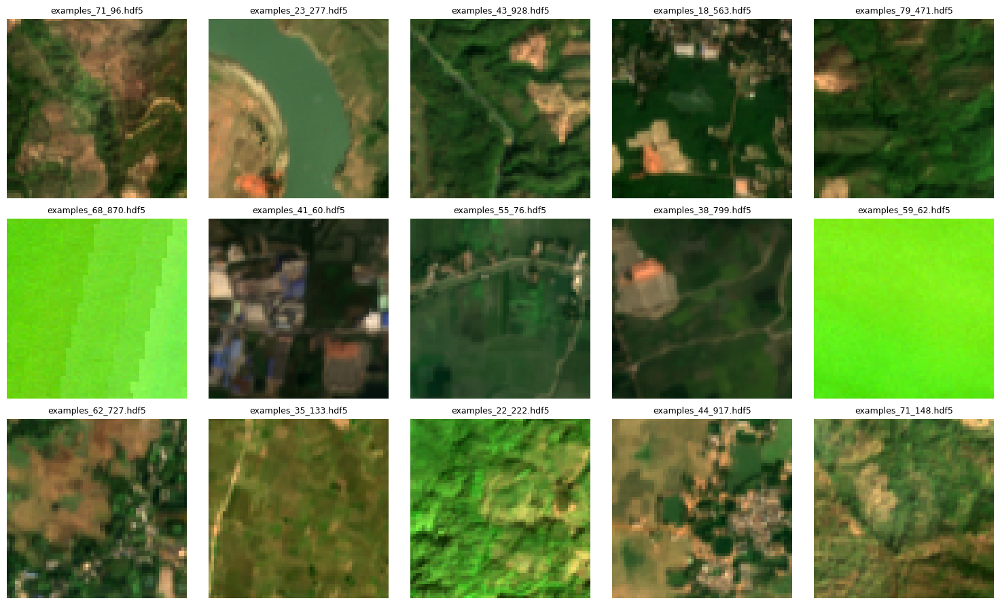

In [ ]:
# Plot a sample of images from the test dataframe
cols = 5
rows = 3

rgb_bands = ("04 - Red", "03 - Green", "02 - Blue")
images = [path for path in os.listdir(images_path) if '.hdf5' in path]

random.seed(42)
random_images = random.sample(images, rows * cols)

fig, axes = plt.subplots(rows, cols, figsize = (15, rows * 3))
axes = axes.flatten()


for i, image_id in enumerate(random_images):

    filename = os.path.join(images_path, image_id)

    with h5py.File(filename, "r") as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)

    axes[i].imshow(true_color)
    axes[i].set_title(image_id, fontsize = 9)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

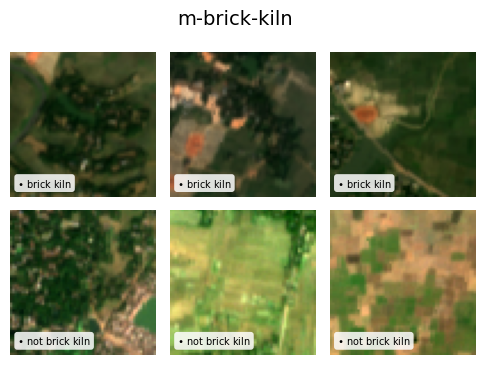

In [11]:
''' Visualizing all images belonging to specific label.
    - rgb_bands have the default name unless specified differently '''

def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))

rgb_bands = ("04 - Red", "03 - Green", "02 - Blue")

images_yes = test_df_brickkiln[test_df_brickkiln.label == 'brick kiln'].image_id.tolist()
images_no = test_df_brickkiln[test_df_brickkiln.label == 'not brick kiln'].image_id.tolist()

random.seed(100)
random_images_yes = random.sample(images_yes, 3)
random_images_no = random.sample(images_no, 3)
random_images = random_images_yes + random_images_no
labels = ['brick kiln' for i in range(3)] + ['not brick kiln' for i in range(3)]

fig, axes = plt.subplots(2, 3, figsize = (6, 4))
axes = axes.flatten()
for i, image_id in enumerate(random_images):
    filename = os.path.join(images_path, image_id + '.hdf5')
    with h5py.File(filename, 'r') as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)
    axes[i].imshow(true_color)
    axes[i].axis("off")

    # Draw label box (upper left corner)
    axes[i].text(
        0.05, 0.07,  # relative position inside axes
        r"$\bullet$ " + labels[i],
        transform= axes[i].transAxes,
        fontsize=7,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round, pad=0.3', alpha=0.85), # background box
        # alpha is for transparency, 0 fully transparent and 1 fully opaque
    )

plt.suptitle("m-brick-kiln", fontsize=14)
plt.subplots_adjust(wspace=0.1, hspace=0.05)
#plt.tight_layout() #rect=[0, 0, 1, 0.93]
plt.savefig("/content/drive/MyDrive/Thesis CLIP4EO/img/m-brick-kiln_image_grid.png")
plt.show()


Sample image: examples_44_637.hdf5 



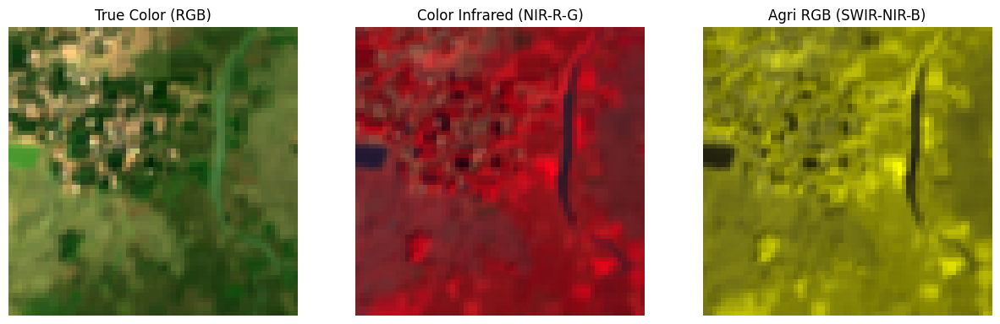

In [ ]:
def normalize(img):
    # Normalize images for display -> all values in [0, 1]
    return (img - np.min(img)) / (np.max(img) - np.min(img))


def plot_image(hdf5_file, rgb_bands = ("04 - Red", "03 - Green", "02 - Blue"),
               false_color_1_bands = ("08 - NIR", "04 - Red", "03 - Green"),
               false_color_2_bands = ("11 - SWIR, 08 - NIR", "02 - Blue")):

    # True Color (R-G-B)
    r = hdf5_file[rgb_bands[0]][:] # shaoe (120, 120)
    g = hdf5_file[rgb_bands[1]][:] # shape (120, 120)
    b = hdf5_file[rgb_bands[2]][:] # shape (120, 120)
    true_color = np.stack([r, g, b], axis=-1) # shape (120, 120, 3)

    # False Color 1 (NIR-R-G)
    nir = hdf5_file[false_color_1_bands[0]][:]
    r = hdf5_file[false_color_1_bands[1]][:]
    g = hdf5_file[false_color_1_bands[2]][:]
    false_color_1 = np.stack([nir, r, g], axis=-1) # shape (120, 120, 3)

    # False Color 2 (SWIR-1, NIR, B)
    swir1 = hdf5_file[false_color_1_bands[0]][:]
    false_color_2 = np.stack([swir1, nir, b], axis=-1) # shape (120, 120, 3)

    # Normalize images
    true_color = normalize(true_color)
    false_color_1 = normalize(false_color_1)
    false_color_2 = normalize(false_color_2)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize = (15, 5))
    axes[0].imshow(true_color)
    axes[0].set_title("True Color (RGB)")
    axes[0].axis("off")

    axes[1].imshow(false_color_1)
    axes[1].set_title("Color Infrared (NIR-R-G)")
    axes[1].axis("off")

    axes[2].imshow(false_color_2)
    axes[2].set_title("Agri RGB (SWIR-NIR-B)")
    axes[2].axis("off")

    plt.show()
    return

# Show the image
print("\nSample image:", image_id, "\n")
plot_image(f)

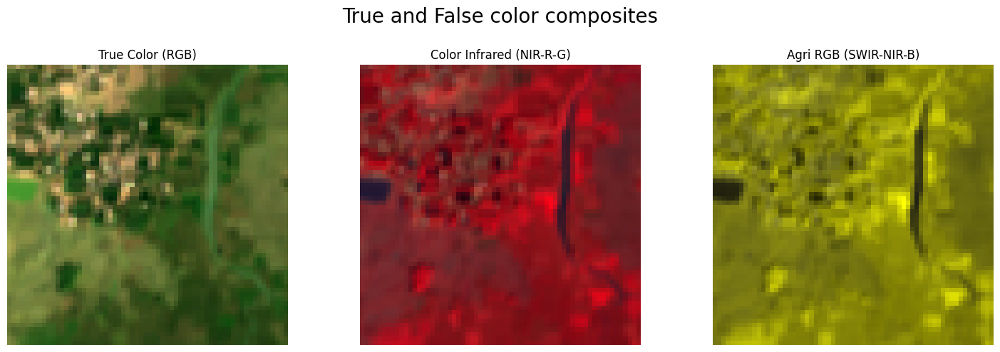

In [ ]:
plot_true_vs_false_composite_image(f)

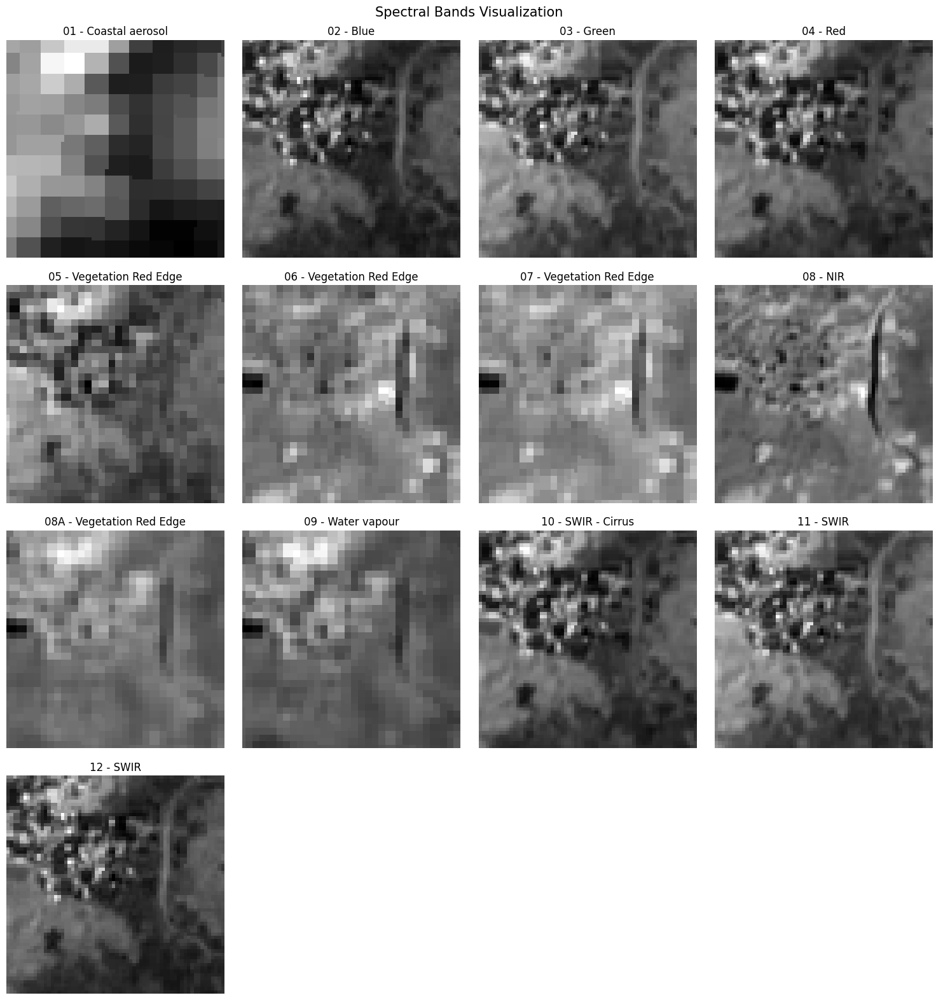

In [ ]:
# Visualize separately all the bands present in the image file
def plot_all_bands(hdf5_file):

    band_names = list(f.keys())
    num_bands = len(band_names)

    cols = 4
    rows = int(np.ceil(num_bands / cols)) # 3

    fig, axes = plt.subplots(rows, cols, figsize = (15, rows * 4))
    axes = axes.flatten()

    for i, band_name in enumerate(band_names):
        band_data = f[band_name][:]

        # Normalize to scale values in [0, 1]
        band_data = normalize(band_data)

        # Plot single band
        axes[i].imshow(band_data, cmap = "gray")
        axes[i].set_title('\n' + band_name)
        axes[i].axis("off")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Spectral Bands Visualization", fontsize = 15)
    plt.tight_layout()
    plt.show()


# Show the bands
plot_all_bands(f)

In [ ]:
# Checking metadata files
[f for f in os.listdir(images_path) if '.hdf5' not in f]

['1.00x_train_partition.json',
 '0.10x_train_partition.json',
 'label_map.json',
 'task_specs.pkl',
 '0.05x_train_partition.json',
 'README',
 '0.20x_train_partition.json',
 'band_stats.json',
 'default_partition.json',
 '0.02x_train_partition.json',
 '0.01x_train_partition.json',
 '0.50x_train_partition.json',
 'LICENSE']

In [ ]:
# Load task specifications object
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
print("Task data:\n", task_data)
print("Bands info:")
task_data.bands_info
#dir(task_data) to see all attributes and methods of task data

Task data:
 classification_v0.8.5/m-brick-kiln
  13 bands, max shape 64x64 @ 10m resolution.
Bands info:


[Sentinel2(name=01 - Coastal aerosol, wavelen=0.443, original_res=60.0m),
 Sentinel2(name=02 - Blue, wavelen=0.49, original_res=10.0m),
 Sentinel2(name=03 - Green, wavelen=0.56, original_res=10.0m),
 Sentinel2(name=04 - Red, wavelen=0.665, original_res=10.0m),
 Sentinel2(name=05 - Vegetation Red Edge, wavelen=0.705, original_res=20.0m),
 Sentinel2(name=06 - Vegetation Red Edge, wavelen=0.74, original_res=20.0m),
 Sentinel2(name=07 - Vegetation Red Edge, wavelen=0.783, original_res=20.0m),
 Sentinel2(name=08 - NIR, wavelen=0.842, original_res=20.0m),
 Sentinel2(name=08A - Vegetation Red Edge, wavelen=0.865, original_res=20.0m),
 Sentinel2(name=09 - Water vapour, wavelen=0.945, original_res=60.0m),
 Sentinel2(name=10 - SWIR - Cirrus, wavelen=1.375, original_res=60.0m),
 Sentinel2(name=11 - SWIR, wavelen=1.61, original_res=20.0m),
 Sentinel2(name=12 - SWIR, wavelen=2.19, original_res=20.0m)]

In [ ]:
# Extract classification labels
brickkiln_labels = task_data.label_type.class_names
brickkiln_labels

['not brick kiln', 'brick kiln']

In [ ]:
# Load the labels for all data samples
with open(os.path.join(images_path, 'label_map.json'), 'r') as file:
    labels = json.load(file)

# Labels associated to sample image
print(len(labels.keys()))
if image_id[:-5] in labels['0']:
    print('The label for', image_id[:-5], 'is 0.')
else:
    print('The label for', image_id[:-5], 'is 1.')

2
The label for examples_44_637 is 0.


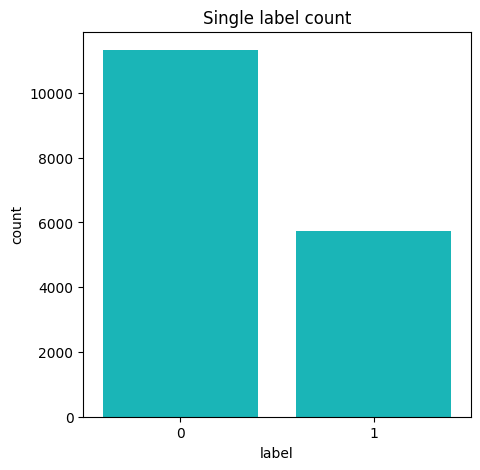


Count of labels
0: 11326
1: 5735


In [ ]:
# Convert to numpy array
label_matrix = np.array([len(labels['0']), len(labels['1'])])

# Barplot of label counts
plt.figure(figsize = (5, 5))
sns.barplot(x = [0, 1], y = label_matrix, color = "darkturquoise")

plt.xlabel("label")
plt.ylabel("count")
plt.title("Single label count")
plt.show()

print('\nCount of labels')
print('0:', len(labels['0']))
print('1:', len(labels['1']))

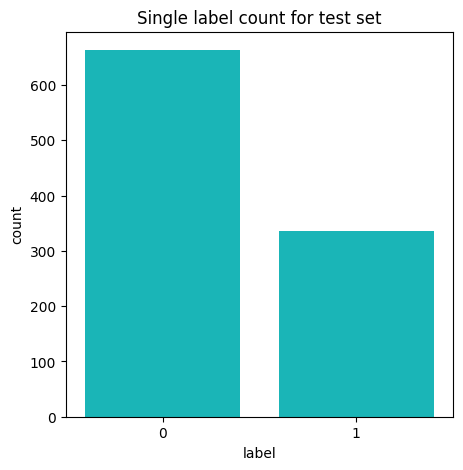

In [ ]:
# Only plot labels of test set
with open(os.path.join(images_path, 'default_partition.json'), 'r') as file:
    partition = json.load(file)

# Convert to numpy array
label_matrix = np.array([len([id for id in partition['test'] if id in labels['0']]),
                         len([id for id in partition['test'] if id in labels['1']])])

# Barplot of label counts
plt.figure(figsize = (5, 5))
sns.barplot(x = [0, 1], y = label_matrix, color = "darkturquoise")

plt.xlabel("label")
plt.ylabel("count")
plt.title("Single label count for test set")
plt.show()

### 2) m-pv4ger

In [12]:
# Set images path and select sample image
idx = 0
images_folder = 'm-pv4ger'
images_path = os.path.join(data_path, images_folder)
image_id = os.listdir(images_path)[idx] # .hdf5 file
print(image_id)
filename = os.path.join(images_path, image_id) # path to .hdf5 file

51.364462877049434,7.122061232370428.hdf5


In [13]:
# Check the content of a .hdf5 file
f = h5py.File(filename, 'r')
print(type(f))
print(len(f.keys()), 'bands available')
list(f.keys())

<class 'h5py._hl.files.File'>
3 bands available


['Blue', 'Green', 'Red']

In [14]:
for key in f.keys():
    data = f[key]
    print(f"Dataset '{key}' shape: {data.shape} dtype: {data.dtype}")

Dataset 'Blue' shape: (320, 320) dtype: uint8
Dataset 'Green' shape: (320, 320) dtype: uint8
Dataset 'Red' shape: (320, 320) dtype: uint8


In [15]:
# Check the content of a single band
print(type(f['Blue']))
f['Blue'][0]

<class 'h5py._hl.dataset.Dataset'>


array([135, 156, 156, 156, 156, 121, 121, 127, 127,  88,  88,  68,  68,
        76,  76,  82,  76,  90,  90, 109, 109, 105, 105,  89,  89,  95,
        95,  93,  93,  83,  83, 105, 105, 105, 105,  82,  82,  76,  76,
        99,  99, 116, 116, 119, 119, 111, 111, 111, 111, 122, 122, 105,
       105,  86,  86,  79,  79,  76,  76,  71,  71,  90,  90,  97,  97,
        96,  96, 109, 109, 116, 116,  95,  95,  87,  87,  87,  87,  84,
        84,  91,  91, 106, 106,  99,  99,  90,  90,  99,  99, 105,  99,
        99,  90,  90,  77,  77,  79,  79,  90,  90,  83,  83,  95,  95,
        87,  87,  98,  98,  91,  91,  99,  99,  92,  92,  98,  98,  91,
        91,  98,  98,  93,  93,  82,  82,  87,  87,  91,  91, 109, 109,
       116, 116, 108, 108,  98,  98, 102, 102, 118, 118, 128, 128,  91,
        91,  79,  79,  80,  80,  93,  93, 116, 116, 106, 106,  89,  89,
        88,  88,  96,  96, 105, 105,  88,  88,  93,  93,  91,  91,  87,
        87,  87,  87, 106, 106,  99,  99,  82,  82,  93,  93, 10

In [16]:
# Read default partition
with open(os.path.join(data_path, images_folder, 'default_partition.json'), 'r') as file:
    def_partition = json.load(file)
    print("Splits:")
    print(list(def_partition.keys()))
    print(len(def_partition['train']), len(def_partition['valid']), len(def_partition['test']))

# Read labels
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
    print("\nLabels:")
    pv4ger_labels = task_data.label_type.class_names
    print(pv4ger_labels)
    # ['no solar pv', 'solar pv']

# Read label map
with open(os.path.join(images_path, 'label_map.json'), 'r') as file:
    label_map = json.load(file)
    print("\nLabels proportion:")
    print("0:", len(label_map['0']))
    print("1:", len(label_map['1']))
    # labels == {'0': [id1, id2, ...], '1': [id4, id5, ...]}

# Reverse the label map: image_id -> label
image_to_label_map = {}
for label, image_list in label_map.items():
    for img_id in image_list:
        if label == '0':
            image_to_label_map[img_id] = pv4ger_labels[0]
        elif label == '1':
            image_to_label_map[img_id] = pv4ger_labels[1]

Splits:
['train', 'valid', 'test']
11814 999 999

Labels:
['no solar pv', 'solar pv']

Labels proportion:
0: 11692
1: 2120


In [17]:
# Build dataFrame for TEST images
data = []
for img_id in def_partition['test']:
    label = image_to_label_map.get(img_id, None)  # None in case any image is missing in label_map
    data.append({
        'image_id': img_id,
        'filename': os.path.join(images_path, img_id + '.hdf5'),
        'bands': 3,
        'split': 'test',
        'label': label
    })

test_df_pv4ger = pd.DataFrame(data)
test_df_pv4ger.head()

,image_id,filename,bands,split,label
0,"7.222180076676272, 50.698836440699615",/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,3,test,no solar pv
1,"6.669612320016594, 51.73787665131514",/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,3,test,no solar pv
2,"6.339084510786531, 51.22087464650394",/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,3,test,no solar pv
3,"8.724089525367726, 51.77399340700887",/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,3,test,no solar pv
4,"7.8016608434245205, 52.243655122484405",/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,3,test,no solar pv


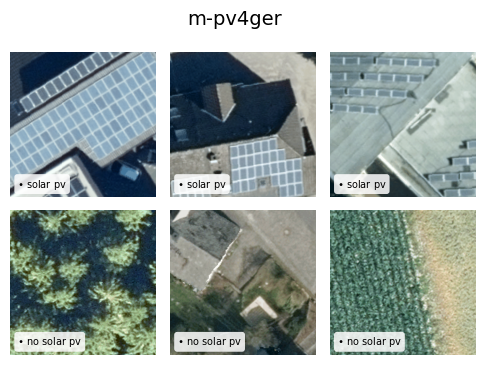

In [18]:
''' Visualizing all images belonging to specific label.
    - rgb_bands have the default name unless specified differently '''

def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))


rgb_bands = ("Red", "Green", "Blue")

images_yes = test_df_pv4ger[test_df_pv4ger.label == 'solar pv'].image_id.tolist()
images_no = test_df_pv4ger[test_df_pv4ger.label == 'no solar pv'].image_id.tolist()

random.seed(50)
random_images_yes = random.sample(images_yes, 3)
random_images_no = random.sample(images_no, 3)
random_images = random_images_yes + random_images_no
labels = ['solar pv' for i in range(3)] + ['no solar pv' for i in range(3)]

fig, axes = plt.subplots(2, 3, figsize = (6, 4))
axes = axes.flatten()
for i, image_id in enumerate(random_images):
    filename = os.path.join(images_path, image_id + '.hdf5')
    with h5py.File(filename, 'r') as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)
    axes[i].imshow(true_color)
    axes[i].axis("off")

    # Draw label box (upper left corner)
    axes[i].text(
        0.05, 0.07,  # relative position inside axes
        r"$\bullet$ " + labels[i],
        transform= axes[i].transAxes,
        fontsize=7,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round, pad=0.3', alpha=0.85), # background box
        # alpha is for transparency, 0 fully transparent and 1 fully opaque
    )

plt.suptitle("m-pv4ger", fontsize=14)
plt.subplots_adjust(wspace=0.1, hspace=0.05)
#plt.tight_layout() #rect=[0, 0, 1, 0.93]
plt.savefig("/content/drive/MyDrive/Thesis CLIP4EO/img/m-pv4ger_image_grid.png")
plt.show()


Sample image: 51.364462877049434,7.122061232370428.hdf5 



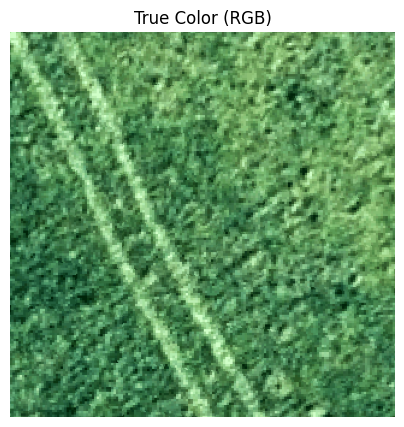

In [ ]:
def normalize(img):
    # Normalize images for display -> all values in [0, 1]
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def plot_image(hdf5_file, rgb_bands = ("Red", "Green", "Blue")):

    # True Color (R-G-B)
    r = hdf5_file[rgb_bands[0]][:]
    g = hdf5_file[rgb_bands[1]][:]
    b = hdf5_file[rgb_bands[2]][:]
    true_color = np.stack([r, g, b], axis=-1) # shape (320, 320, 3)

    # Normalize images
    true_color = normalize(true_color)

    # Plot
    fig = plt.figure(figsize = (5, 5))
    plt.imshow(true_color)
    plt.title("True Color (RGB)")
    plt.axis("off")
    plt.show()
    return

# Show the image
print("\nSample image:", image_id, "\n")
plot_image(f)

Let's also have a look at all the bands contained in the image, independently:

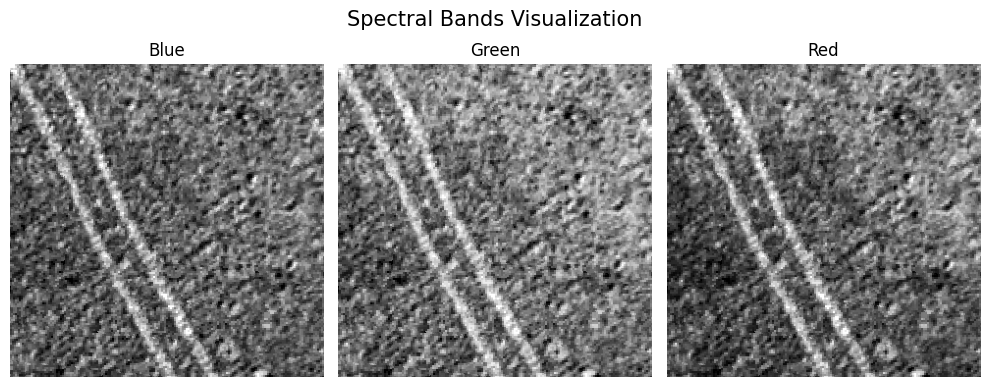

In [ ]:
# Visualize separately all the bands present in the image file
def plot_all_bands(hdf5_file):

    band_names = list(f.keys())
    num_bands = len(band_names)

    cols = 3
    rows = int(np.ceil(num_bands / cols)) # 1

    fig, axes = plt.subplots(rows, cols, figsize = (10, rows * 4))
    axes = axes.flatten()

    for i, band_name in enumerate(band_names):
        band_data = f[band_name][:]

        # Normalize to scale values in [0, 1]
        band_data = normalize(band_data)

        # Plot single band
        axes[i].imshow(band_data, cmap = "gray")
        axes[i].set_title('\n' + band_name)
        axes[i].axis("off")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Spectral Bands Visualization", fontsize = 15)
    plt.tight_layout()
    plt.show()


# Show the bands
plot_all_bands(f)

In [ ]:
# Checking metadata files
[f for f in os.listdir(images_path) if '.hdf5' not in f]

['0.05x_train_partition.json',
 'README',
 'band_stats.json',
 '0.02x_train_partition.json',
 'default_partition.json',
 '0.20x_train_partition.json',
 'LICENSE',
 '0.01x_train_partition.json',
 '0.50x_train_partition.json',
 '1.00x_train_partition.json',
 '0.10x_train_partition.json',
 'label_map.json',
 'task_specs.pkl']

In [ ]:
# Load task specifications object
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
print("Task data:\n", task_data)
print("Bands info:")
task_data.bands_info
#dir(task_data) to see all attributes and methods of task data

Task data:
 classification_v0.8.5/m-pv4ger
  3 bands, max shape 320x320 @ 0.1m resolution.
Bands info:


[SpectralBand(name=Red, wavelen=0.665, original_res=0.1m),
 SpectralBand(name=Green, wavelen=0.56, original_res=0.1m),
 SpectralBand(name=Blue, wavelen=0.49, original_res=0.1m)]

In [ ]:
# Extract classification labels
print(task_data.label_type)
pv4ger_labels = task_data.label_type.class_names
pv4ger_labels

2-classification (no solar pv, solar pv.)


['no solar pv', 'solar pv']

In [ ]:
# Load the labels for all data samples
with open(os.path.join(images_path, 'label_map.json'), 'r') as file:
    labels = json.load(file)

labels.keys()

dict_keys(['0', '1'])

Sample image: 51.364462877049434,7.122061232370428.hdf5 



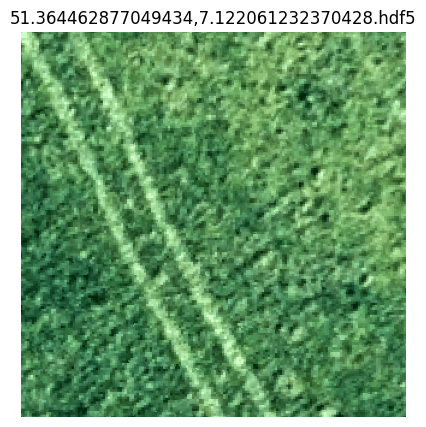


Labels:

['no solar pv']


In [ ]:
# Plot image and associated labels
def plot_with_labels(image_id):

    print("Sample image:", image_id, "\n")

    filename = os.path.join(images_path, image_id)

    with h5py.File(filename, "r") as f:
        # Load True Color (R-G-B)
        r = f[list(f.keys())[2]][:]
        g = f[list(f.keys())[1]][:]
        b = f[list(f.keys())[0]][:]
        true_color = np.stack([r, g, b], axis = -1)

    true_color = normalize(true_color)

    fig = plt.figure(figsize = (5, 5))
    plt.imshow(true_color)
    plt.title(filename.split('/')[-1])
    plt.axis("off")
    plt.show()

    print("\nLabels:\n")

    # Get all labels associated to image
    image_labels = []
    for k in labels.keys():
        if image_id[:-5] in labels[k]:
            image_labels.append(task_data.label_type.class_names[int(k)])

    print(image_labels)

    return

plot_with_labels(image_id)

Sample image: 6.919869,51.837401.hdf5 



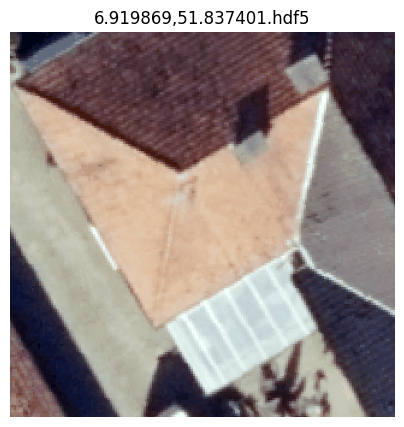


Labels:

['solar pv']


In [ ]:
image_id_1 = '6.919869,51.837401.hdf5'
plot_with_labels(image_id_1)

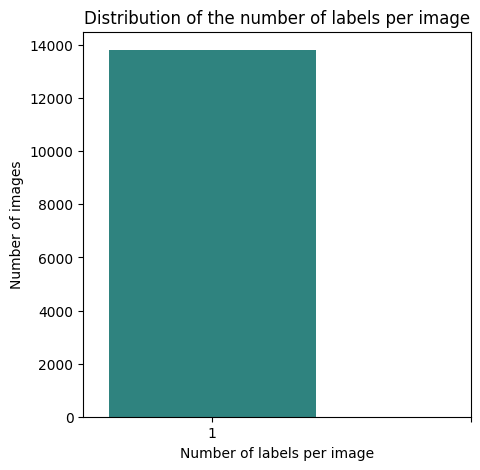


Statistics:

       Number of labels
count           13812.0
mean                1.0
std                 0.0
min                 1.0
25%                 1.0
50%                 1.0
75%                 1.0
max                 1.0


In [ ]:
from collections import defaultdict

# count number of labels per image
image_label_count = defaultdict(int)
for label, images in labels.items():
    for img in images:
        image_label_count[img] += 1

# create frequency distribution
n_labels_df = pd.DataFrame({'Number of labels': list(image_label_count.values())})
count_distribution = n_labels_df['Number of labels'].value_counts().sort_index()

# Barplot
plt.figure(figsize = (5, 5))
sns.barplot(x = count_distribution.index, y = count_distribution.values, palette = 'viridis')

plt.xlabel("Number of labels per image")
plt.ylabel("Number of images")
plt.title("Distribution of the number of labels per image")
plt.xticks(range(0, max(image_label_count.values()) + 1))
plt.show()

# Summary statistics
print("\nStatistics:\n")
print(n_labels_df.describe())

In [ ]:
count_distribution

,Number of labels
1,13812


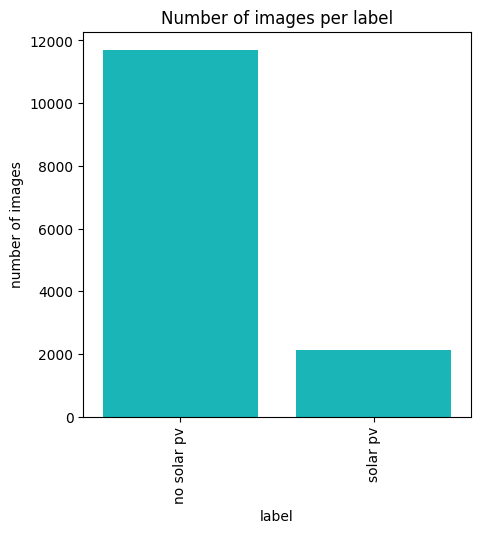

In [ ]:
# Count images per label
image_counts = [len(images) for images in labels.values()]

# Barplot
plt.figure(figsize = (5, 5))
sns.barplot(x = pv4ger_labels, y = image_counts, color = "darkturquoise")

plt.xlabel("label")
plt.ylabel("number of images")
plt.title("Number of images per label")
plt.xticks(rotation = 90)
plt.show()

## Multiclass Classification

### 3) m-eurosat

In [19]:
# Set images path and select sample image
idx = 0
images_folder = 'm-eurosat'
images_path = os.path.join(data_path, images_folder)
image_id = os.listdir(images_path)[idx] # .hdf5 file
print(image_id)
filename = os.path.join(images_path, image_id) # path to .hdf5 file
print(filename)
# Check the content of a .hdf5 file
f = h5py.File(filename, 'r')
print("Type:", type(f))
print("Bands:", len(f.keys()), 'bands available')
list(f.keys())

id_25673.hdf5
/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-eurosat/id_25673.hdf5
Type: <class 'h5py._hl.files.File'>
Bands: 13 bands available


['01 - Coastal aerosol',
 '02 - Blue',
 '03 - Green',
 '04 - Red',
 '05 - Vegetation Red Edge',
 '06 - Vegetation Red Edge',
 '07 - Vegetation Red Edge',
 '08 - NIR',
 '08A - Vegetation Red Edge',
 '09 - Water vapour',
 '10 - SWIR - Cirrus',
 '11 - SWIR',
 '12 - SWIR']

In [20]:
for key in f.keys():
    data = f[key]
    print(f"Dataset '{key}' shape: {data.shape} dtype: {data.dtype}")

Dataset '01 - Coastal aerosol' shape: (64, 64) dtype: int16
Dataset '02 - Blue' shape: (64, 64) dtype: int16
Dataset '03 - Green' shape: (64, 64) dtype: int16
Dataset '04 - Red' shape: (64, 64) dtype: int16
Dataset '05 - Vegetation Red Edge' shape: (64, 64) dtype: int16
Dataset '06 - Vegetation Red Edge' shape: (64, 64) dtype: int16
Dataset '07 - Vegetation Red Edge' shape: (64, 64) dtype: int16
Dataset '08 - NIR' shape: (64, 64) dtype: int16
Dataset '08A - Vegetation Red Edge' shape: (64, 64) dtype: int16
Dataset '09 - Water vapour' shape: (64, 64) dtype: int16
Dataset '10 - SWIR - Cirrus' shape: (64, 64) dtype: int16
Dataset '11 - SWIR' shape: (64, 64) dtype: int16
Dataset '12 - SWIR' shape: (64, 64) dtype: int16


In [21]:
# Check the content of a single band
print(type(f['02 - Blue']))
f['02 - Blue'][0]

<class 'h5py._hl.dataset.Dataset'>


array([1017, 1017, 1044,  933,  985, 1251, 1145, 1167, 1327, 1328, 1216,
       1210, 1356, 1393, 1285, 1223, 1123, 1157, 1142, 1030,  929,  894,
        872,  905,  942, 1060, 1189, 1142, 1322,  972,  955, 1001, 1022,
       1088, 1222, 1753, 2118, 1763, 1331, 1408, 1249, 1212, 1657, 1182,
       1178, 1083, 1118, 1106, 1193, 1204, 1095, 1195, 1090, 1018, 1162,
       1215, 1248, 1298, 1201, 1196, 1299, 1196, 1145, 1171], dtype=int16)

In [22]:
# Load task specifications object
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
print("Task data:\n", task_data)
print("Bands info:")
task_data.bands_info
#dir(task_data) to see all attributes and methods of task data

Task data:
 classification_v0.8.5/m-eurosat
  13 bands, max shape 64x64 @ 10m resolution.
Bands info:


[Sentinel2(name=01 - Coastal aerosol, wavelen=0.443, original_res=60.0m),
 Sentinel2(name=02 - Blue, wavelen=0.49, original_res=10.0m),
 Sentinel2(name=03 - Green, wavelen=0.56, original_res=10.0m),
 Sentinel2(name=04 - Red, wavelen=0.665, original_res=10.0m),
 Sentinel2(name=05 - Vegetation Red Edge, wavelen=0.705, original_res=20.0m),
 Sentinel2(name=06 - Vegetation Red Edge, wavelen=0.74, original_res=20.0m),
 Sentinel2(name=07 - Vegetation Red Edge, wavelen=0.783, original_res=20.0m),
 Sentinel2(name=08 - NIR, wavelen=0.842, original_res=20.0m),
 Sentinel2(name=08A - Vegetation Red Edge, wavelen=0.865, original_res=20.0m),
 Sentinel2(name=09 - Water vapour, wavelen=0.945, original_res=60.0m),
 Sentinel2(name=10 - SWIR - Cirrus, wavelen=1.375, original_res=60.0m),
 Sentinel2(name=11 - SWIR, wavelen=1.61, original_res=20.0m),
 Sentinel2(name=12 - SWIR, wavelen=2.19, original_res=20.0m)]

In [ ]:
# Extract classification labels
eurosat_labels = task_data.label_type.class_names
print("Eurosat labels:\n")
print('-', len(eurosat_labels), 'labels -\n')
eurosat_labels

Eurosat labels:

- 10 labels -



['Industrial Buildings',
 'Residential Buildings',
 'Annual Crop',
 'Permanent Crop',
 'River',
 'Sea and Lake',
 'Herbaceous Vegetation',
 'Highway',
 'Pasture',
 'Forest']

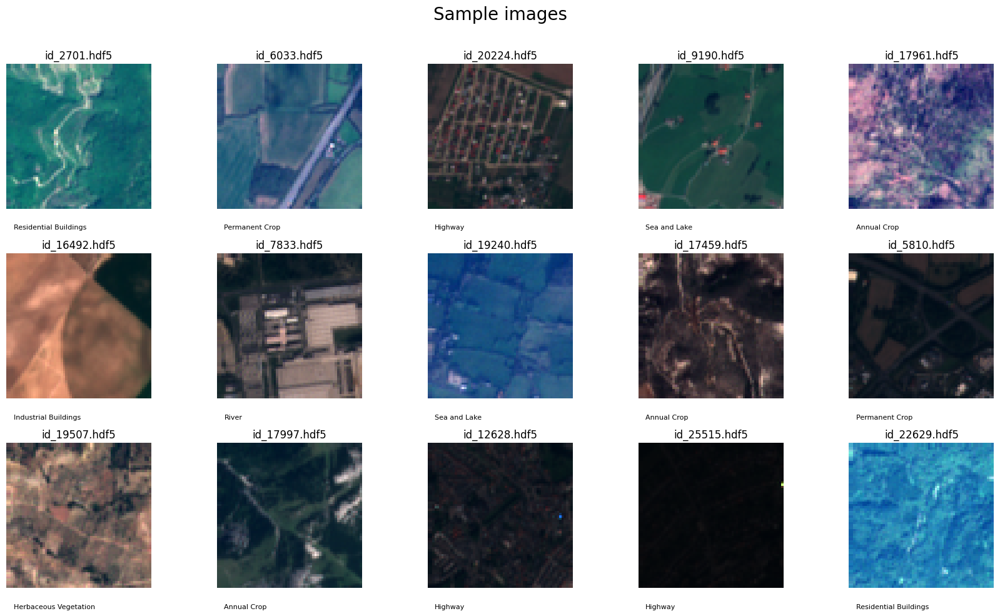

In [ ]:
# Visualize sample images
plot_random_images(images_path, 20, ["04 - Red", "03 - Green", "02 - Blue"], eurosat_labels, labels)

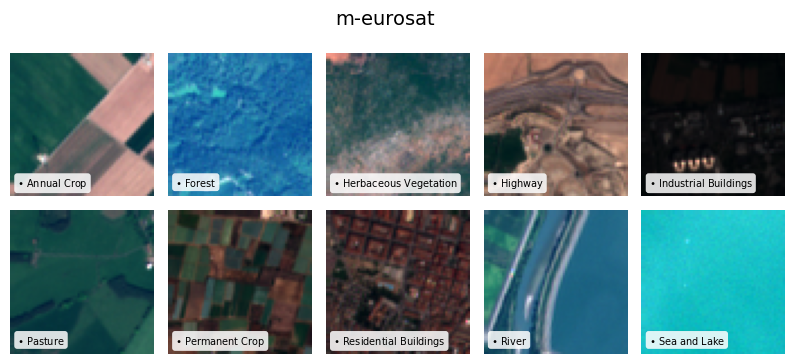

In [23]:
''' Visualizing all images belonging to specific label.
    - rgb_bands have the default name unless specified differently '''

def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))


test_df_eurosat = pd.read_csv('/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/test_df_m-eurosat.csv')
test_df_eurosat.head()

rgb_bands = ["04 - Red", "03 - Green", "02 - Blue"]

random.seed(42)

sampled_df = test_df_eurosat.groupby("label").sample(n=1, random_state=42)
labels = list(sampled_df.label)


fig, axes = plt.subplots(2, 5, figsize = (10, 4))
axes = axes.flatten()
for i, image_filename in enumerate(sampled_df.filename.tolist()):
    #filename = os.path.join(images_path, image_id + '.hdf5')
    with h5py.File(image_filename, 'r') as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)
    axes[i].imshow(true_color)
    axes[i].axis("off")

    # Draw label box (upper left corner)
    axes[i].text(
        0.05, 0.07,  # relative position inside axes
        r"$\bullet$ " + labels[i],
        transform= axes[i].transAxes,
        fontsize=7,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round, pad=0.3', alpha=0.85), # background box
        # alpha is for transparency, 0 fully transparent and 1 fully opaque
    )

plt.suptitle("m-eurosat", fontsize=14)
plt.subplots_adjust(wspace=0.1, hspace=0.05)
#plt.tight_layout() #rect=[0, 0, 1, 0.93]
plt.savefig("/content/drive/MyDrive/Thesis CLIP4EO/img/m-eurosat_image_grid.png")
plt.show()

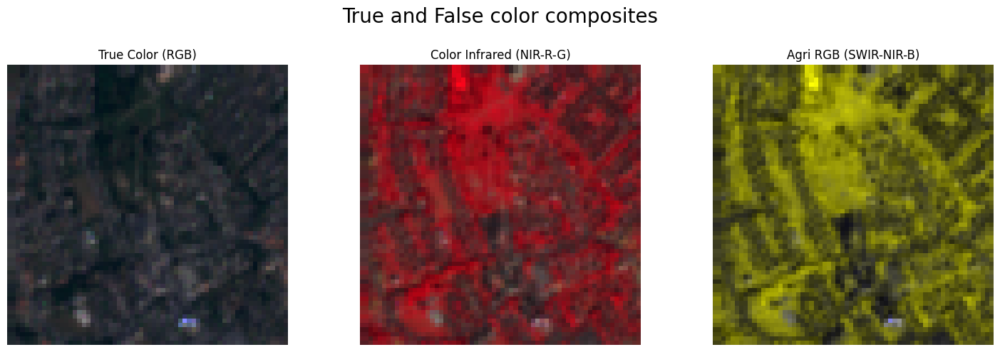

In [ ]:
plot_true_vs_false_composite_image(f)

Let's also have a look at all the bands contained in the image, independently:

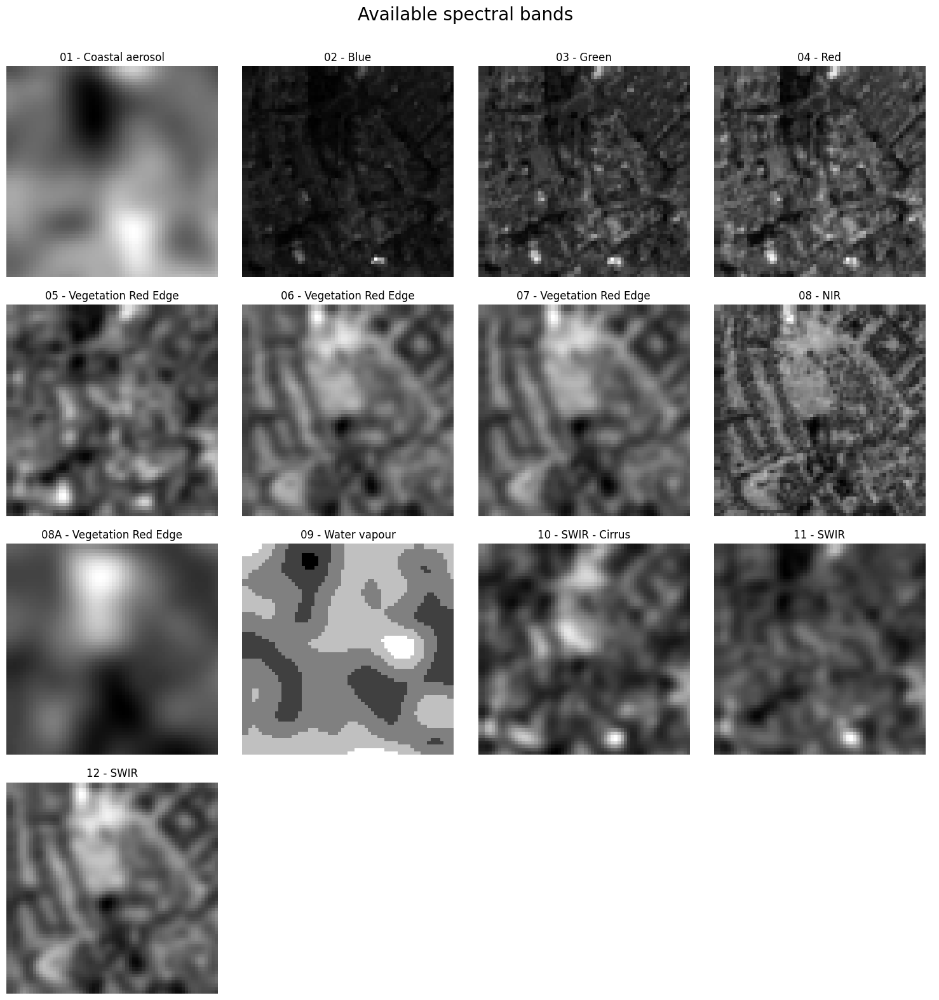

In [ ]:
# Visualize separately all the available bands
plot_all_bands(f)

In [ ]:
# Checking metadata files
[f for f in os.listdir(images_path) if '.hdf5' not in f] # -> no dedicated file for label maps!

['0.10x_train_partition.json',
 '0.20x_train_partition.json',
 'default_partition.json',
 '0.02x_train_partition.json',
 '0.50x_train_partition.json',
 'task_specs.pkl',
 '1.00x_train_partition.json',
 'band_stats.json',
 '0.01x_train_partition.json',
 'LICENSE',
 'README',
 '0.05x_train_partition.json']

In [ ]:
from pathlib import Path

labels = {}
image_ids = [img_id for img_id in os.listdir(images_path) if '.hdf5' in img_id]

for img_id in image_ids:
    filename = os.path.join(images_path, img_id)
    # need to convert filename from str to Path, or it raises an error
    sample = geobench.load_sample_hdf5(Path(filename), label_only = True)
    labels[img_id] = sample.label

labels

{'id_25673.hdf5': 7,
 'id_20114.hdf5': 7,
 'id_18221.hdf5': 3,
 'id_19628.hdf5': 6,
 'id_0558.hdf5': 0,
 'id_25895.hdf5': 8,
 'id_18152.hdf5': 3,
 'id_26728.hdf5': 9,
 'id_16861.hdf5': 1,
 'id_21614.hdf5': 0,
 'id_19191.hdf5': 5,
 'id_25793.hdf5': 7,
 'id_26618.hdf5': 9,
 'id_19101.hdf5': 5,
 'id_18112.hdf5': 3,
 'id_7584.hdf5': 4,
 'id_9122.hdf5': 5,
 'id_15445.hdf5': 9,
 'id_21394.hdf5': 9,
 'id_3836.hdf5': 2,
 'id_13203.hdf5': 8,
 'id_8782.hdf5': 5,
 'id_18997.hdf5': 4,
 'id_6744.hdf5': 3,
 'id_17734.hdf5': 2,
 'id_24750.hdf5': 5,
 'id_26131.hdf5': 8,
 'id_14929.hdf5': 9,
 'id_18351.hdf5': 3,
 'id_10268.hdf5': 6,
 'id_16767.hdf5': 0,
 'id_22899.hdf5': 2,
 'id_18062.hdf5': 3,
 'id_23820.hdf5': 3,
 'id_17644.hdf5': 2,
 'id_17157.hdf5': 1,
 'id_14685.hdf5': 9,
 'id_5205.hdf5': 2,
 'id_9542.hdf5': 5,
 'id_23396.hdf5': 3,
 'id_0681.hdf5': 0,
 'id_7464.hdf5': 4,
 'id_4746.hdf5': 2,
 'id_19758.hdf5': 6,
 'id_24133.hdf5': 4,
 'id_26171.hdf5': 8,
 'id_19031.hdf5': 4,
 'id_16074.hdf5': 9,
 'i

In [ ]:
len(labels.keys()) # ok

4000

In [ ]:
# Save dictionary to .csv file

# df = pd.DataFrame(list(labels.items()), columns = ['eurosat_image_id', 'label_idx'])
# csv_filename = 'eurosat_labels.csv'
# df.to_csv(f'/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-eurosat/{csv_filename}', index = False)

In [ ]:
# SAVE LABELS to file so they can be loaded easily to a .json file
with open('/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-eurosat/eurosat_labels.json', 'w') as json_file:
    json.dump(labels, json_file)

In [ ]:
# READ LABELS from file
with open('/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-eurosat/eurosat_labels.json', 'r') as json_file:
    labels = json.load(json_file)

labels

In [ ]:
# Open and read label stats file
with open(os.path.join(images_path, 'band_stats.json'), 'r') as file:
    bands = json.load(file)
bands

{'01 - Coastal aerosol': {'max': 3929.0,
  'mean': 1356.781697,
  'median': 1317.0,
  'min': 858.0,
  'percentile_0_1': 903.0,
  'percentile_1': 974.0,
  'percentile_5': 1045.0,
  'percentile_95': 1837.0,
  'percentile_99': 2097.0,
  'percentile_99_9': 2709.001000000164,
  'std': 246.33561916377468},
 '02 - Blue': {'max': 28000.0,
  'mean': 1123.138498,
  'median': 1049.0,
  'min': 1.0,
  'percentile_0_1': 641.0,
  'percentile_1': 703.0,
  'percentile_5': 763.0,
  'percentile_95': 1701.0,
  'percentile_99': 2250.0,
  'percentile_99_9': 3546.001000000164,
  'std': 334.2812437339313},
 '03 - Green': {'max': 28000.0,
  'mean': 1057.277004,
  'median': 982.0,
  'min': 0.0,
  'percentile_0_1': 424.0,
  'percentile_1': 468.0,
  'percentile_5': 596.0,
  'percentile_95': 1771.0,
  'percentile_99': 2338.0,
  'percentile_99_9': 3729.0,
  'std': 392.23216876587765},
 '04 - Red': {'max': 20756.0,
  'mean': 959.177867,
  'median': 807.0,
  'min': 0.0,
  'percentile_0_1': 231.0,
  'percentile_1': 24

Sample image: id_25673.hdf5 



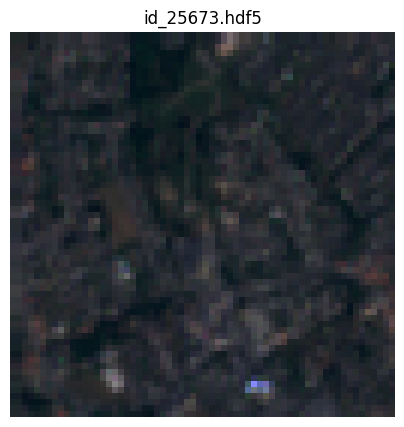


Labels:

- Highway


In [ ]:
# Plot image and associated labels
def plot_with_labels(image_id, labels, multiclasslabels, rgb_bands = ("04 - Red", "03 - Green", "02 - Blue")):

    print("Sample image:", image_id, "\n")

    filename  = os.path.join(images_path, image_id)

    with h5py.File(filename, "r") as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis = -1)

    true_color = normalize(true_color)

    fig = plt.figure(figsize = (5, 5))
    plt.imshow(true_color)
    plt.title(filename.split('/')[-1])
    plt.axis("off")
    plt.show()

    print("\nLabels:\n")

    print('-', multiclasslabels[labels[image_id]])

    return

plot_with_labels(image_id, labels, eurosat_labels)

In [ ]:
labels[image_id]

7

In [ ]:
# Count number of (positive) labels per image
n_labels = [sum(l) for l in labels.values()]

# Create a frequency count of the occurrences
n_labels_df = pd.DataFrame({'Number of labels': n_labels})
count_distribution = n_labels_df['Number of labels'].value_counts().sort_index()

# Barplot
plt.figure(figsize = (10, 5))
sns.barplot(x = count_distribution.index, y = count_distribution.values, palette = 'viridis')

plt.xlabel("number of labels per image")
plt.ylabel("number of images")
plt.title("Distribution of the number of labels per image")
plt.xticks(range(0, max(n_labels)))
plt.show()

# Summary statistics
print("\nStatistics:\n")
print(n_labels_df.describe())

In [ ]:
count_distribution

In [ ]:
# Convert to numpy array for easier summation
label_matrix = np.array(list(labels.values()))  # Shape: (num_samples, 43)

# Count the number of times each label is positive
positive_per_label = np.sum(label_matrix, axis=0)

# Barplot
plt.figure(figsize=(12, 5))
sns.barplot(x = eurosat_labels, y = positive_per_label, color = "darkturquoise")

plt.xlabel("label")
plt.ylabel("count")
plt.title("Single label count")
plt.xticks(rotation = 90)
plt.show()

### 4) m-so2sat

In [24]:
# Set images path and select sample image
idx = 0
images_folder = 'm-so2sat'
images_path = os.path.join(data_path, images_folder)
image_id = os.listdir(images_path)[idx] # .hdf5 file
print(image_id)
filename = os.path.join(images_path, image_id) # path to .hdf5 file

id_141935.hdf5


In [25]:
# Check the content of a .hdf5 file
f = h5py.File(filename, 'r')
print(type(f))
print(len(f.keys()), 'bands available')
list(f.keys())

<class 'h5py._hl.files.File'>
18 bands available


['01 - VH.Real',
 '02 - Blue',
 '02 - VH.Imaginary',
 '03 - Green',
 '03 - VV.Real',
 '04 - Red',
 '04 - VV.Imaginary',
 '05 - VH.LEE Filtered',
 '05 - Vegetation Red Edge',
 '06 - VV.LEE Filtered',
 '06 - Vegetation Red Edge',
 '07 - VH.LEE Filtered.Real',
 '07 - Vegetation Red Edge',
 '08 - NIR',
 '08 - VV.LEE Filtered.Imaginary',
 '08A - Vegetation Red Edge',
 '11 - SWIR',
 '12 - SWIR']

In [26]:
for key in f.keys():
    data = f[key]
    print(f"Dataset '{key}' shape: {data.shape} dtype: {data.dtype}")

Dataset '01 - VH.Real' shape: (32, 32) dtype: float32
Dataset '02 - Blue' shape: (32, 32) dtype: float32
Dataset '02 - VH.Imaginary' shape: (32, 32) dtype: float32
Dataset '03 - Green' shape: (32, 32) dtype: float32
Dataset '03 - VV.Real' shape: (32, 32) dtype: float32
Dataset '04 - Red' shape: (32, 32) dtype: float32
Dataset '04 - VV.Imaginary' shape: (32, 32) dtype: float32
Dataset '05 - VH.LEE Filtered' shape: (32, 32) dtype: float32
Dataset '05 - Vegetation Red Edge' shape: (32, 32) dtype: float32
Dataset '06 - VV.LEE Filtered' shape: (32, 32) dtype: float32
Dataset '06 - Vegetation Red Edge' shape: (32, 32) dtype: float32
Dataset '07 - VH.LEE Filtered.Real' shape: (32, 32) dtype: float32
Dataset '07 - Vegetation Red Edge' shape: (32, 32) dtype: float32
Dataset '08 - NIR' shape: (32, 32) dtype: float32
Dataset '08 - VV.LEE Filtered.Imaginary' shape: (32, 32) dtype: float32
Dataset '08A - Vegetation Red Edge' shape: (32, 32) dtype: float32
Dataset '11 - SWIR' shape: (32, 32) dtype: 

In [ ]:
# Check the content of a single band
print(type(f['02 - Blue']))
f['02 - Blue'][0]

<class 'h5py._hl.dataset.Dataset'>


array([0.1209, 0.1242, 0.1264, 0.1233, 0.1247, 0.1247, 0.1259, 0.1283,
       0.1371, 0.131 , 0.131 , 0.1284, 0.1247, 0.1227, 0.1196, 0.1196,
       0.1239, 0.1214, 0.1204, 0.1249, 0.1249, 0.1238, 0.1293, 0.127 ,
       0.1323, 0.1323, 0.1258, 0.1211, 0.1217, 0.1325, 0.1325, 0.1289],
      dtype=float32)

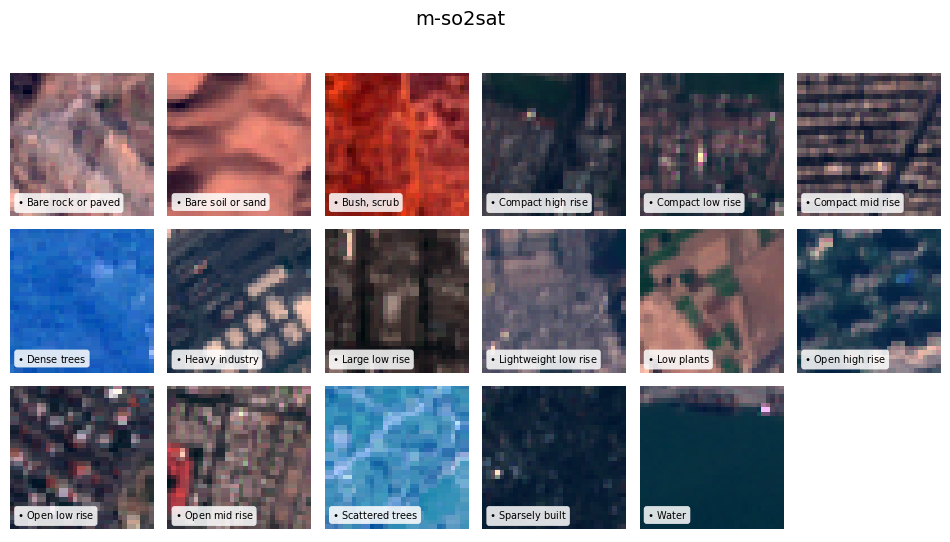

In [27]:
''' Visualizing all images belonging to specific label.
    - rgb_bands have the default name unless specified differently '''

def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))


test_df_so2sat = pd.read_csv('/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/test_df_m-so2sat.csv')

rgb_bands = ["04 - Red", "03 - Green", "02 - Blue"]


sampled_df = test_df_so2sat.groupby("label").sample(n=1, random_state = 21)
labels = list(sampled_df.label)


fig, axes = plt.subplots(3, 6, figsize = (12, 6))
axes = axes.flatten()
for i, image_filename in enumerate(sampled_df.filename.tolist()):
    #filename = os.path.join(images_path, image_id + '.hdf5')
    with h5py.File(image_filename, 'r') as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)
    axes[i].imshow(true_color)
    axes[i].axis("off")

    # Draw label box (upper left corner)
    axes[i].text(
        0.05, 0.07,  # relative position inside axes
        r"$\bullet$ " + labels[i],
        transform= axes[i].transAxes,
        fontsize=7,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round, pad=0.3', alpha=0.85), # background box
        # alpha is for transparency, 0 fully transparent and 1 fully opaque
    )

# Hide unused axes (if any)
for i in range(len(labels), len(axes)):
    axes[i].axis('off')

plt.suptitle("m-so2sat", fontsize=14)
plt.subplots_adjust(wspace=0.1, hspace=0.05)
#plt.tight_layout() #rect=[0, 0, 1, 0.93]
plt.savefig("/content/drive/MyDrive/Thesis CLIP4EO/img/m-so2sat_image_grid.png")
plt.show()


Sample image: id_141935.hdf5 



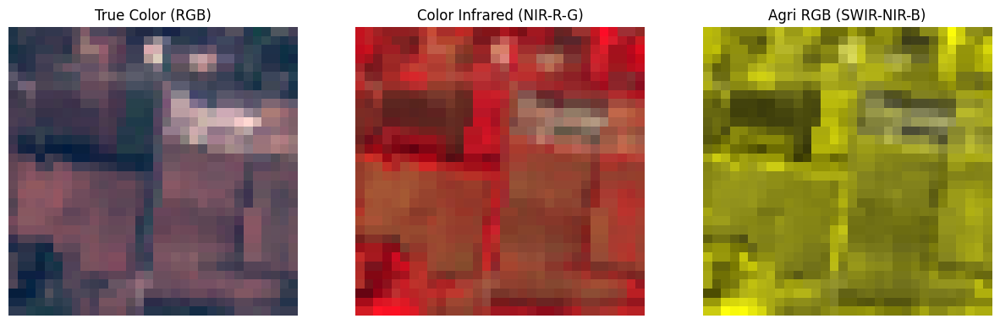

In [ ]:
def normalize(img):
    # Normalize images for display -> all values in [0, 1]
    return (img - np.min(img)) / (np.max(img) - np.min(img))


def plot_image(hdf5_file, rgb_bands = ("04 - Red", "03 - Green", "02 - Blue"),
               false_color_1_bands = ("08 - NIR", "04 - Red", "03 - Green"),
               false_color_2_bands = ("11 - SWIR, 08 - NIR", "02 - Blue")):

    # True Color (R-G-B)
    r = hdf5_file[rgb_bands[0]][:] # shaoe (32, 32)
    g = hdf5_file[rgb_bands[1]][:]
    b = hdf5_file[rgb_bands[2]][:]
    true_color = np.stack([r, g, b], axis=-1) # shape (32, 32, 3)

    # False Color 1 (NIR-R-G)
    nir = hdf5_file[false_color_1_bands[0]][:]
    r = hdf5_file[false_color_1_bands[1]][:]
    g = hdf5_file[false_color_1_bands[2]][:]
    false_color_1 = np.stack([nir, r, g], axis=-1)

    # False Color 2 (SWIR-1, NIR, B)
    swir1 = hdf5_file[false_color_1_bands[0]][:]
    false_color_2 = np.stack([swir1, nir, b], axis=-1)

    # Normalize images
    true_color = normalize(true_color)
    false_color_1 = normalize(false_color_1)
    false_color_2 = normalize(false_color_2)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize = (15, 5))
    axes[0].imshow(true_color)
    axes[0].set_title("True Color (RGB)")
    axes[0].axis("off")

    axes[1].imshow(false_color_1)
    axes[1].set_title("Color Infrared (NIR-R-G)")
    axes[1].axis("off")

    axes[2].imshow(false_color_2)
    axes[2].set_title("Agri RGB (SWIR-NIR-B)")
    axes[2].axis("off")

    plt.show()
    return

# Show the image
print("\nSample image:", image_id, "\n")
plot_image(f)

Let's also have a look at all the bands contained in the image, independently:

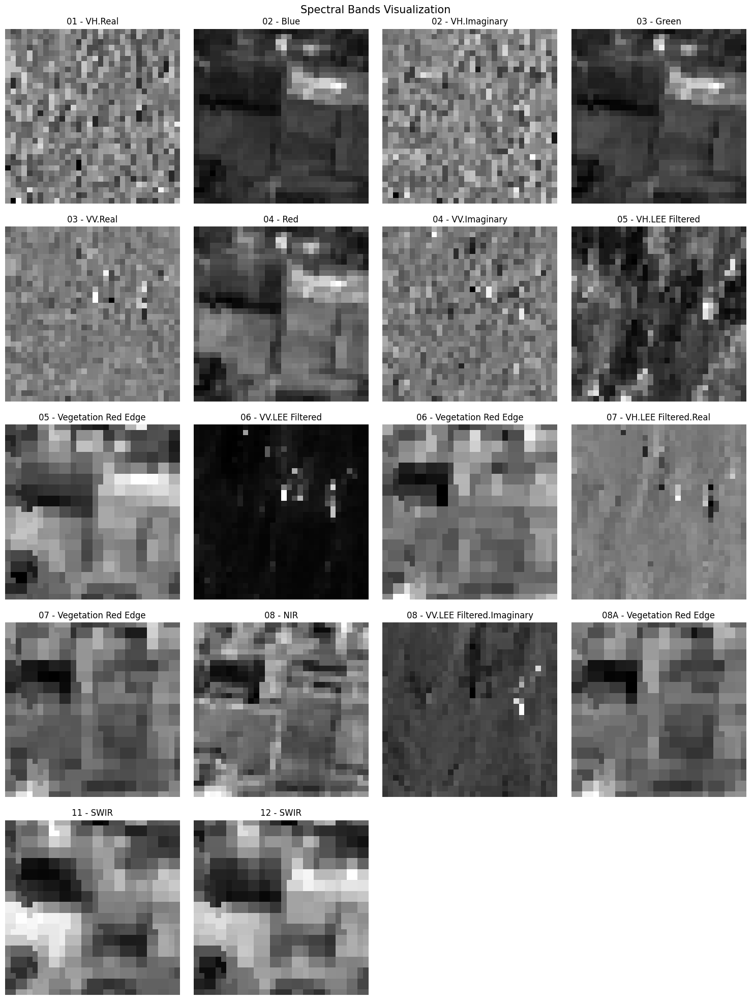

In [ ]:
# Visualize separately all the bands present in the image file
def plot_all_bands(hdf5_file):

    band_names = list(f.keys())
    num_bands = len(band_names)

    cols = 4
    rows = int(np.ceil(num_bands / cols)) # 3

    fig, axes = plt.subplots(rows, cols, figsize = (15, rows * 4))
    axes = axes.flatten()

    for i, band_name in enumerate(band_names):
        band_data = f[band_name][:]

        # Normalize to scale values in [0, 1]
        band_data = normalize(band_data)

        # Plot single band
        axes[i].imshow(band_data, cmap = "gray")
        axes[i].set_title('\n' + band_name)
        axes[i].axis("off")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Spectral Bands Visualization", fontsize = 15)
    plt.tight_layout()
    plt.show()
    return


# Show the bands
plot_all_bands(f)

In [ ]:
# Checking metadata files
[f for f in os.listdir(images_path) if '.hdf5' not in f]

['README',
 '0.05x_train_partition.json',
 'band_stats.json',
 '0.02x_train_partition.json',
 '0.20x_train_partition.json',
 'default_partition.json',
 '0.01x_train_partition.json',
 '0.50x_train_partition.json',
 'LICENSE',
 '1.00x_train_partition.json',
 '0.10x_train_partition.json',
 'task_specs.pkl']

In [ ]:
# Load task specifications object
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
print("Task data:\n", task_data)
#print("Bands info:")
#task_data.bands_info
#dir(task_data) to see all attributes and methods of task data

Task data:
 classification_v0.8.5/m-so2sat
  18 bands, max shape 32x32 @ 10m resolution.


In [ ]:
# Extract classification labels
so2sat_labels = task_data.label_type.class_names
so2sat_labels

['Compact high rise',
 'Compact mid rise',
 'Compact low rise',
 'Open high rise',
 'Open mid rise',
 'Open low rise',
 'Lightweight low rise',
 'Large low rise',
 'Sparsely built',
 'Heavy industry',
 'Dense trees',
 'Scattered trees',
 'Bush, scrub',
 'Low plants',
 'Bare rock or paved',
 'Bare soil or sand',
 'Water']

### 5) m-forestnet

In [28]:
# Set images path and select sample image
idx = 0
images_folder = 'm-forestnet'
images_path = os.path.join(data_path, images_folder)
image_id = os.listdir(images_path)[idx] # .hdf5 file
print(image_id)
filename = os.path.join(images_path, image_id) # path to .hdf5 file

-1.720266384577504_115.00699582064485_2017_01_01.hdf5


In [29]:
# Check the content of a .hdf5 file
f = h5py.File(filename, 'r')
print(type(f))
print(len(f.keys()), 'bands available')
list(f.keys())

<class 'h5py._hl.files.File'>
6 bands available


['02 - Blue_2017-01-01',
 '03 - Green_2017-01-01',
 '04 - Red_2017-01-01',
 '05 - NIR_2017-01-01',
 '06 - SWIR1_2017-01-01',
 '07 - SWIR2_2017-01-01']

In [30]:
for key in f.keys():
    data = f[key]
    print(f"Dataset '{key}' shape: {data.shape} dtype: {data.dtype}")

Dataset '02 - Blue_2017-01-01' shape: (332, 332) dtype: uint8
Dataset '03 - Green_2017-01-01' shape: (332, 332) dtype: uint8
Dataset '04 - Red_2017-01-01' shape: (332, 332) dtype: uint8
Dataset '05 - NIR_2017-01-01' shape: (332, 332) dtype: uint8
Dataset '06 - SWIR1_2017-01-01' shape: (332, 332) dtype: uint8
Dataset '07 - SWIR2_2017-01-01' shape: (332, 332) dtype: uint8


In [ ]:
# Check the content of a single band
print(type(f['02 - Blue_2017-01-01']))
f['02 - Blue_2017-01-01'][0]

<class 'h5py._hl.dataset.Dataset'>


array([ 74,  71,  71,  74,  74,  77,  77,  78,  86,  84,  77,  75,  75,
        76,  76,  74,  74,  74,  76,  74,  74,  73,  73,  73,  74,  76,
        78,  76,  69,  71,  69,  67,  66,  68,  70,  71,  70,  68,  68,
        71,  68,  67,  71,  71,  71,  71,  70,  71,  70,  70,  69,  68,
        69,  69,  71,  70,  71,  70,  70,  70,  69,  68,  71,  68,  70,
        71,  70,  71,  72,  73,  74,  75,  75,  75,  72,  72,  72,  73,
        74,  75,  74,  74,  77,  77,  76,  77,  74,  71,  72,  74,  75,
        75,  74,  67,  68,  69,  70,  69,  69,  69,  69,  68,  69,  71,
        71,  71,  72,  72,  71,  71,  71,  71,  71,  70,  71,  74,  71,
        71,  69,  71,  70,  72,  73,  74,  75,  75,  74,  71,  72,  74,
        72,  71,  72,  72,  72,  72,  73,  72,  71,  71,  71,  74,  76,
        76,  77,  78,  75,  75,  74,  75,  77,  80,  79,  81,  80,  84,
        85,  89,  84,  83,  92, 104,  92,  83,  85,  80,  78,  76,  74,
        74,  73,  71,  74,  74,  75,  74,  73,  76,  79,  78,  7

In [31]:
# Read default partition
with open(os.path.join(data_path, images_folder, 'default_partition.json'), 'r') as file:
    def_partition = json.load(file)
    print("Splits:")
    print(list(def_partition.keys()))
    print(len(def_partition['train']), len(def_partition['valid']), len(def_partition['test']))

# Read labels
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
    print("\nLabels:")
    forestnet_labels = task_data.label_type.class_names #12
    print('-', task_data.label_type.n_classes, "labels -")
    for l in forestnet_labels:
        print(l)

# Read label map
with open(os.path.join(images_path, 'label_map.json'), 'r') as file:
    label_map = json.load(file)
    print("\nLabels proportion:")
    for k in label_map.keys():
        print(f"{k}:", len(label_map[k]))
    # labels == {'0': [id1, id2, ...], '1': [id4, id5, ...], ..., '11': [id34, id56, ...]}

# Reverse the label map: image_id -> label
image_to_label_map = {}
for label, image_list in label_map.items():
    for img_id in image_list:
        image_to_label_map[img_id] = forestnet_labels[int(label)]

Splits:
['train', 'valid', 'test']
6464 989 993

Labels:
- 12 labels -
Oil palm plantation
Timber plantation
Other large-scale plantations
Grassland shrubland
Small-scale agriculture
Small-scale mixed plantation
Small-scale oil palm plantation
Mining
Fish pond
Logging
Secondary forest
Other

Labels proportion:
0: 1764
1: 1208
2: 618
3: 748
4: 1858
5: 622
6: 428
7: 250
8: 124
9: 200
10: 370
11: 256


In [32]:
# Build dataFrame for TEST images
data = []
for img_id in def_partition['test']:
    label = image_to_label_map.get(img_id, None)  # None in case any image is missing in label_map
    data.append({
        'image_id': img_id,
        'filename': os.path.join(images_path, img_id + '.hdf5'),
        'bands': len(h5py.File(filename, 'r').keys()),
        'split': 'test',
        'label': label
    })

test_df_forestnet = pd.DataFrame(data)
test_df_forestnet.head()

,image_id,filename,bands,split,label
0,-1.358752546215941_113.47632662109709_2014_01_01,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,6,test,Oil palm plantation
1,-0.3909200308691534_116.02049649124226_2015_01_01,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,6,test,Oil palm plantation
2,-1.8806664692642177_111.7221681696664_2013_10_30,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,6,test,Oil palm plantation
3,0.3935898654105616_99.19789981112714_2013_01_01,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,6,test,Oil palm plantation
4,-2.0832762463589005_104.28473205885147_2018_08_05,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,6,test,Grassland shrubland


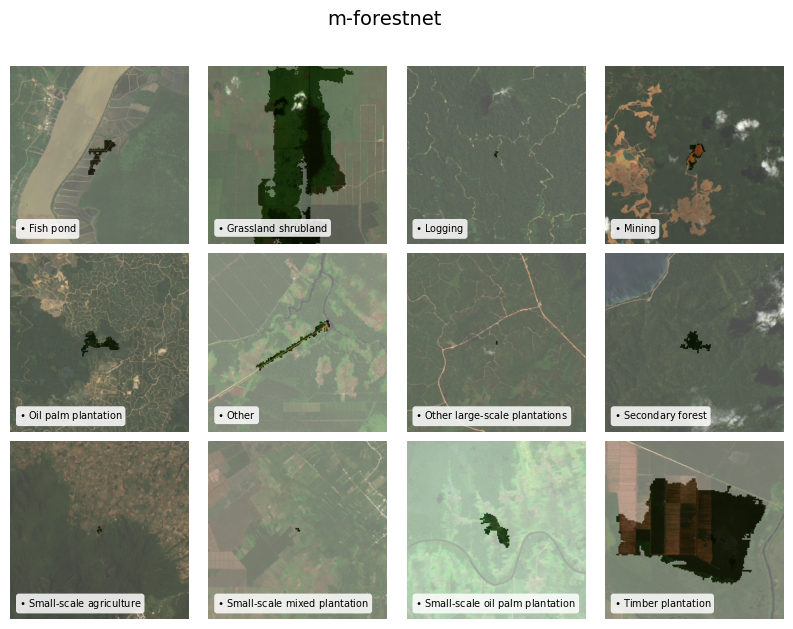

In [33]:
''' Visualizing all images belonging to specific label.
    - rgb_bands have the default name unless specified differently '''

def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))



rgb_bands = ["04 - Red", "03 - Green", "02 - Blue"]


sampled_df = test_df_forestnet.groupby("label").sample(n=1, random_state = 42)
labels = list(sampled_df.label)


fig, axes = plt.subplots(3, 4, figsize = (10, 7))
axes = axes.flatten()
for i, image_filename in enumerate(sampled_df.filename.tolist()):
    #filename = os.path.join(images_path, image_id + '.hdf5')
    with h5py.File(image_filename, 'r') as f:
        r = f[[i for i in f.keys() if rgb_bands[0] in i][0]][:]
        g = f[[i for i in f.keys() if rgb_bands[1] in i][0]][:]
        b = f[[i for i in f.keys() if rgb_bands[2] in i][0]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)
    axes[i].imshow(true_color)
    axes[i].axis("off")

    # Draw label box (upper left corner)
    axes[i].text(
        0.05, 0.07,  # relative position inside axes
        r"$\bullet$ " + labels[i],
        transform= axes[i].transAxes,
        fontsize=7,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round, pad=0.3', alpha=0.85), # background box
        # alpha is for transparency, 0 fully transparent and 1 fully opaque
    )

# Hide unused axes (if any)
for i in range(len(labels), len(axes)):
    axes[i].axis('off')

plt.suptitle("m-forestnet", fontsize=14)
plt.subplots_adjust(top=0.9, wspace=0.1, hspace=0.05)
#plt.subplots_adjust(wspace=0.1, hspace=0.05)
#plt.tight_layout() #rect=[0, 0, 1, 0.93]
plt.savefig("/content/drive/MyDrive/Thesis CLIP4EO/img/m-forestnet_image_grid.png")
plt.show()


Sample image: -1.720266384577504_115.00699582064485_2017_01_01.hdf5 



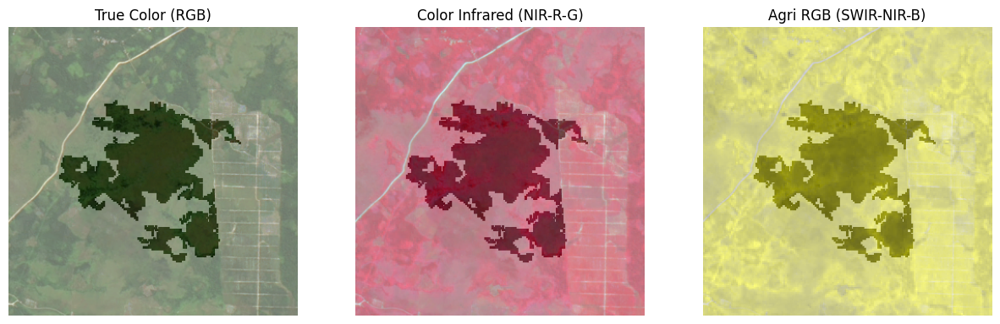

In [ ]:
def normalize(img):
    # Normalize images for display -> all values in [0, 1]
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def plot_image(hdf5_file, rgb_bands = ("04 - Red_2017-01-01", "03 - Green_2017-01-01", "02 - Blue_2017-01-01"),
               false_color_1_bands = ("05 - NIR_2017-01-01", "04 - Red_2017-01-01", "03 - Green_2017-01-01"),
               false_color_2_bands = ("06 - SWIR1_2017-01-01", "05 - NIR_2017-01-01", "02 - Blue_2017-01-01")): # needs to be SWIR 1!!!

    # True Color (R-G-B)
    r = hdf5_file[rgb_bands[0]][:]
    g = hdf5_file[rgb_bands[1]][:]
    b = hdf5_file[rgb_bands[2]][:]
    true_color = np.stack([r, g, b], axis=-1) # shape (332, 332, 3)

    # False Color 1 (NIR-R-G)
    nir = hdf5_file[false_color_1_bands[0]][:]
    r = hdf5_file[false_color_1_bands[1]][:]
    g = hdf5_file[false_color_1_bands[2]][:]
    false_color_1 = np.stack([nir, r, g], axis=-1)

    # False Color 2 (SWIR-1, NIR, B)
    swir1 = hdf5_file[false_color_1_bands[0]][:]
    false_color_2 = np.stack([swir1, nir, b], axis=-1)

    # Normalize images
    true_color = normalize(true_color)
    false_color_1 = normalize(false_color_1)
    false_color_2 = normalize(false_color_2)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize = (15, 5))
    axes[0].imshow(true_color)
    axes[0].set_title("True Color (RGB)")
    axes[0].axis("off")

    axes[1].imshow(false_color_1)
    axes[1].set_title("Color Infrared (NIR-R-G)")
    axes[1].axis("off")

    axes[2].imshow(false_color_2)
    axes[2].set_title("Agri RGB (SWIR-NIR-B)")
    axes[2].axis("off")

    plt.show()
    return

# Show the image
print("\nSample image:", image_id, "\n")
plot_image(f)

Let's also have a look at all the bands contained in the image, independently:

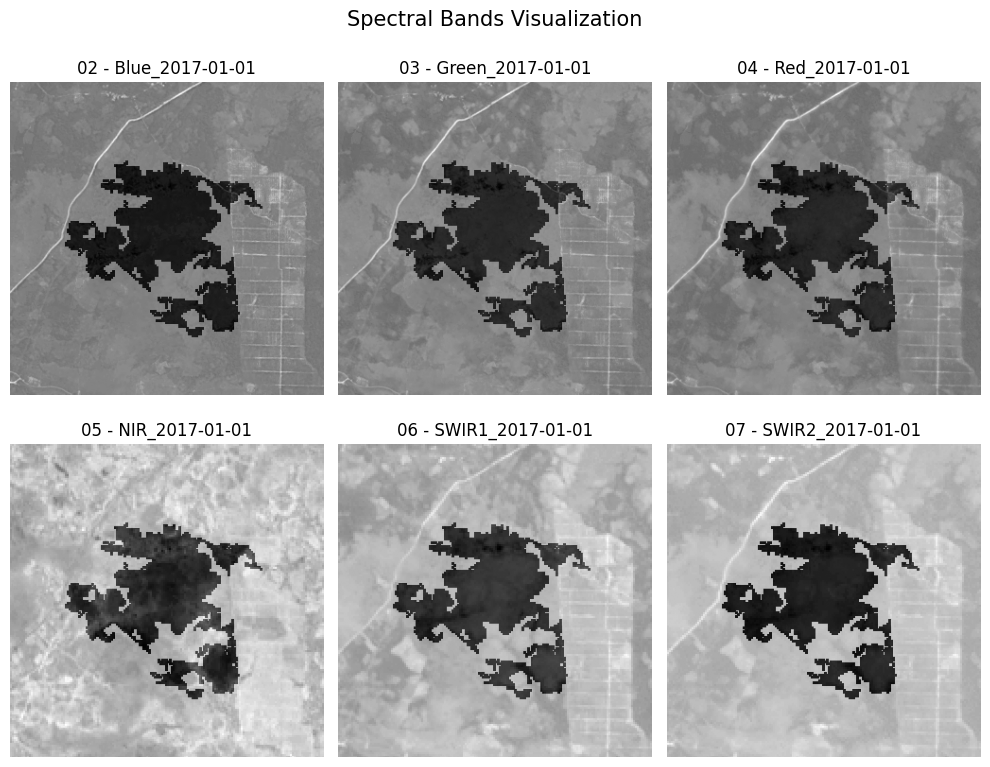

In [ ]:
# Visualize separately all the bands present in the image file
def plot_all_bands(hdf5_file):

    band_names = list(f.keys())
    num_bands = len(band_names)

    cols = 3
    rows = int(np.ceil(num_bands / cols)) # 2

    fig, axes = plt.subplots(rows, cols, figsize = (10, rows * 4))
    axes = axes.flatten()

    for i, band_name in enumerate(band_names):
        band_data = f[band_name][:]

        # Normalize to scale values in [0, 1]
        band_data = normalize(band_data)

        # Plot single band
        axes[i].imshow(band_data, cmap = "gray")
        axes[i].set_title('\n' + band_name)
        axes[i].axis("off")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Spectral Bands Visualization", fontsize = 15)
    plt.tight_layout()
    plt.show()


# Show the bands
plot_all_bands(f)

In [ ]:
# Checking metadata files
[f for f in os.listdir(images_path) if '.hdf5' not in f]

['0.01x_train_partition.json',
 '0.50x_train_partition.json',
 'LICENSE',
 '0.02x_train_partition.json',
 '0.20x_train_partition.json',
 'band_stats.json',
 'default_partition.json',
 '0.05x_train_partition.json',
 'task_specs.pkl',
 'README',
 'label_map.json',
 '0.10x_train_partition.json',
 '1.00x_train_partition.json']

In [ ]:
# Load task specifications object
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
print("Task data:\n", task_data)
print("Bands info:")
task_data.bands_info
#dir(task_data) to see all attributes and methods of task data

Task data:
 classification_v0.8.5/m-forestnet
  6 bands, max shape 332x332 @ 15m resolution.
Bands info:


[Landsat8(name=04 - Red, wavelen=0.6546, original_res=15.0m),
 Landsat8(name=03 - Green, wavelen=0.5614, original_res=15.0m),
 Landsat8(name=02 - Blue, wavelen=0.482, original_res=15.0m),
 Landsat8(name=05 - NIR, wavelen=0.8647, original_res=30.0m),
 Landsat8(name=06 - SWIR1, wavelen=1.6089, original_res=30.0m),
 Landsat8(name=07 - SWIR2, wavelen=2.2007, original_res=30.0m)]

In [ ]:
# Extract classification labels
print(task_data.label_type)
forestnet_labels = task_data.label_type.class_names
forestnet_labels

12-classification (Oil palm plantation, Timber plantation, Other large-scale plantations...)


['Oil palm plantation',
 'Timber plantation',
 'Other large-scale plantations',
 'Grassland shrubland',
 'Small-scale agriculture',
 'Small-scale mixed plantation',
 'Small-scale oil palm plantation',
 'Mining',
 'Fish pond',
 'Logging',
 'Secondary forest',
 'Other']

In [ ]:
# Load the labels for all data samples
with open(os.path.join(images_path, 'label_map.json'), 'r') as file:
    labels = json.load(file)

labels.keys()

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

Sample image: -1.720266384577504_115.00699582064485_2017_01_01.hdf5 



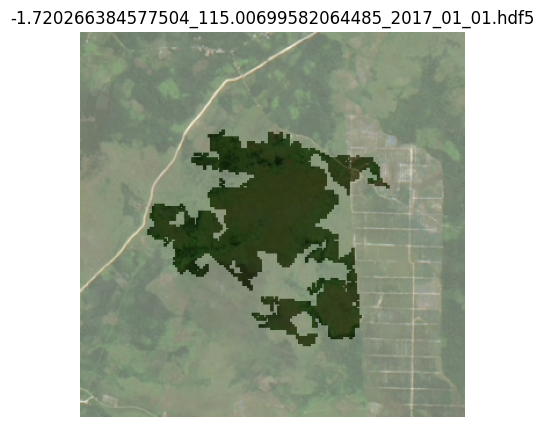


Labels:

['Grassland shrubland']


In [ ]:
# Plot image and associated labels
def plot_with_labels(image_id):

    print("Sample image:", image_id, "\n")

    filename = os.path.join(images_path, image_id)

    with h5py.File(filename, "r") as f:
        # Load True Color (R-G-B)
        r = f[list(f.keys())[2]][:]
        g = f[list(f.keys())[1]][:]
        b = f[list(f.keys())[0]][:]
        true_color = np.stack([r, g, b], axis = -1)

    true_color = normalize(true_color)

    fig = plt.figure(figsize = (5, 5))
    plt.imshow(true_color)
    plt.title(filename.split('/')[-1])
    plt.axis("off")
    plt.show()

    print("\nLabels:\n")

    # Get all labels associated to image
    image_labels = []
    for k in labels.keys():
        if image_id[:-5] in labels[k]:
            image_labels.append(task_data.label_type.class_names[int(k)])

    print(image_labels)

    return

plot_with_labels(image_id)

Sample image: 1.7960511270750177_98.6761097040342_2016_01_23.hdf5 



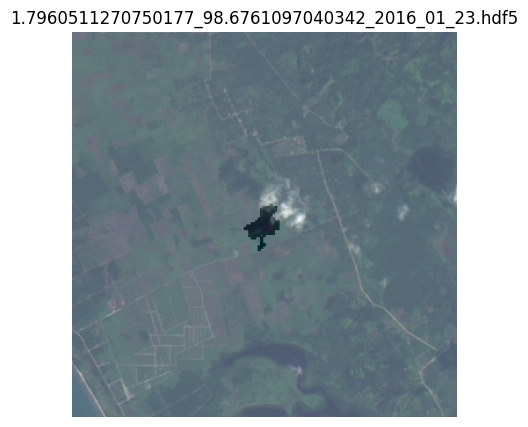


Labels:

['Small-scale oil palm plantation']


In [ ]:
image_id_1 = os.listdir(images_path)[1]
plot_with_labels(image_id_1)

Sample image: 0.91516190618374_100.82167407618526_2015_01_01.hdf5 



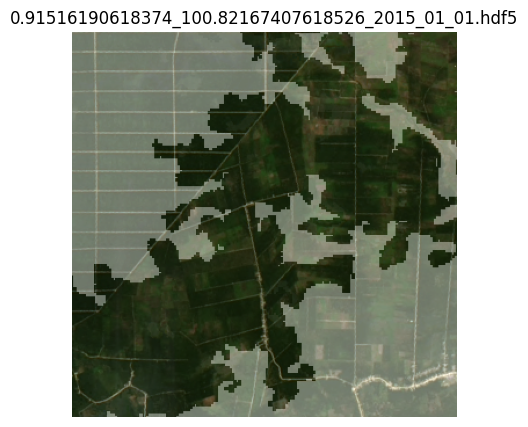


Labels:

['Small-scale mixed plantation']


In [ ]:
image_id_1 = os.listdir(images_path)[50]
plot_with_labels(image_id_1)

Let's check the distribution of labels per image:

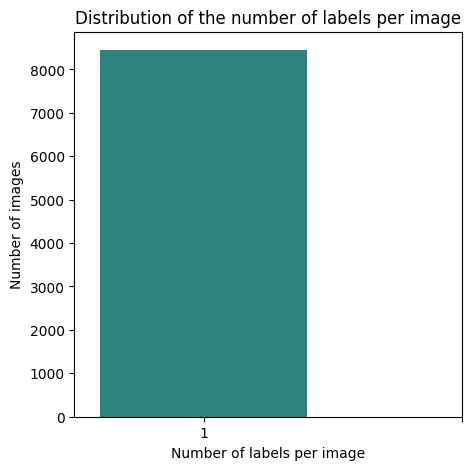


Statistics:

       Number of labels
count            8446.0
mean                1.0
std                 0.0
min                 1.0
25%                 1.0
50%                 1.0
75%                 1.0
max                 1.0


In [ ]:
from collections import defaultdict

# count number of labels per image
image_label_count = defaultdict(int)
for label, images in labels.items():
    for img in images:
        image_label_count[img] += 1

# create frequency distribution
n_labels_df = pd.DataFrame({'Number of labels': list(image_label_count.values())})
count_distribution = n_labels_df['Number of labels'].value_counts().sort_index()

# Barplot
plt.figure(figsize = (5, 5))
sns.barplot(x = count_distribution.index, y = count_distribution.values, palette = 'viridis')

plt.xlabel("Number of labels per image")
plt.ylabel("Number of images")
plt.title("Distribution of the number of labels per image")
plt.xticks(range(0, max(image_label_count.values()) + 1))
plt.show()

# Summary statistics
print("\nStatistics:\n")
print(n_labels_df.describe())

In [ ]:
count_distribution

,Number of labels
1,8446


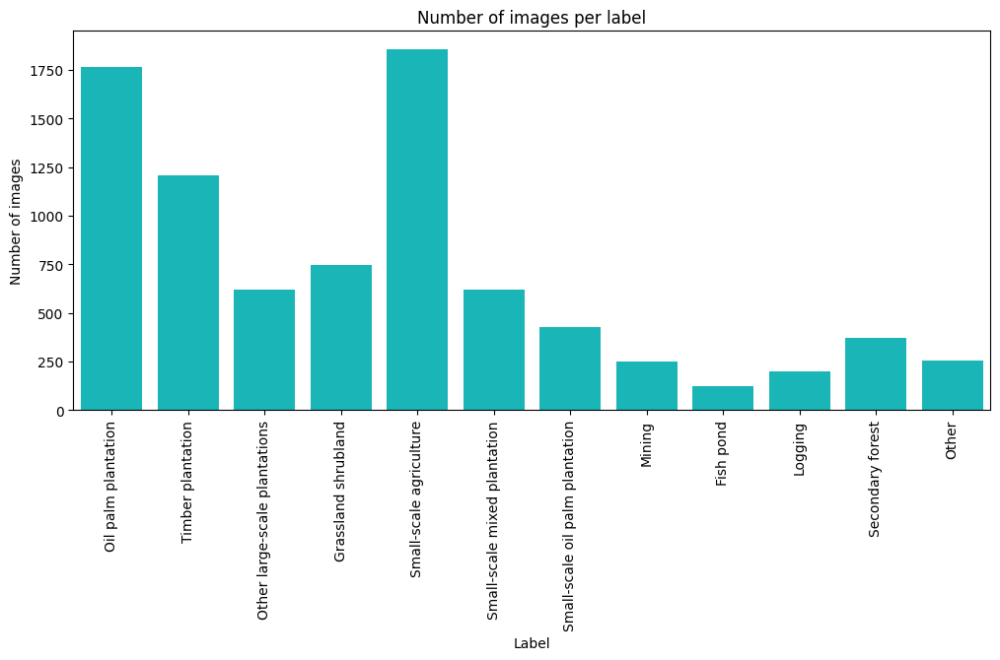

In [ ]:
# Count images per label
image_counts = [len(images) for images in labels.values()]

# Barplot
plt.figure(figsize=(12, 5))
sns.barplot(x = forestnet_labels, y = image_counts, color="darkturquoise")

plt.xlabel("Label")
plt.ylabel("Number of images")
plt.title("Number of images per label")
plt.xticks(rotation = 90)
plt.show()

## Multilabel Classification

### 6) m-bigearthnet

Let's have a look at each dataset.

In [34]:
# Set images path and select sample image
idx = 0
images_folder = 'm-bigearthnet'
images_path = os.path.join(data_path, images_folder)
image_id = os.listdir(images_path)[idx] # .hdf5 file
print(image_id)
filename = os.path.join(images_path, image_id) # path to .hdf5 file
print(filename)
# Check the content of a .hdf5 file
f = h5py.File(filename, 'r')
print("Type:", type(f))
print("Bands:", len(f.keys()), 'bands available')
list(f.keys())

id_46052.hdf5
/content/drive/MyDrive/Thesis CLIP4EO/GEO-Bench classification data/m-bigearthnet/id_46052.hdf5
Type: <class 'h5py._hl.files.File'>
Bands: 12 bands available


['01 - Coastal aerosol',
 '02 - Blue',
 '03 - Green',
 '04 - Red',
 '05 - Vegetation Red Edge',
 '06 - Vegetation Red Edge',
 '07 - Vegetation Red Edge',
 '08 - NIR',
 '08A - Vegetation Red Edge',
 '09 - Water vapour',
 '11 - SWIR',
 '12 - SWIR']

In [35]:
# Content of h5df file
for key in f.keys():
    data = f[key]
    print(f"Dataset '{key}' shape: {data.shape} dtype: {data.dtype}")

Dataset '01 - Coastal aerosol' shape: (120, 120) dtype: float32
Dataset '02 - Blue' shape: (120, 120) dtype: float32
Dataset '03 - Green' shape: (120, 120) dtype: float32
Dataset '04 - Red' shape: (120, 120) dtype: float32
Dataset '05 - Vegetation Red Edge' shape: (120, 120) dtype: float32
Dataset '06 - Vegetation Red Edge' shape: (120, 120) dtype: float32
Dataset '07 - Vegetation Red Edge' shape: (120, 120) dtype: float32
Dataset '08 - NIR' shape: (120, 120) dtype: float32
Dataset '08A - Vegetation Red Edge' shape: (120, 120) dtype: float32
Dataset '09 - Water vapour' shape: (120, 120) dtype: float32
Dataset '11 - SWIR' shape: (120, 120) dtype: float32
Dataset '12 - SWIR' shape: (120, 120) dtype: float32


In [36]:
# Content of a single band
print(type(f['02 - Blue']))
f['02 - Blue'][0]

<class 'h5py._hl.dataset.Dataset'>


array([ 174.,  206.,  203.,  199.,  257.,  389.,  612.,  577.,  454.,
        287.,  234.,  224.,  206.,  228.,  212.,  174.,  181.,  190.,
        191.,  184.,  190.,  188.,  157.,  182.,  166.,  134.,  173.,
        188.,  163.,  182.,  218.,  247.,  282.,  316.,  419.,  519.,
        219.,  156.,  187.,  166.,  200.,  192.,  199.,  205.,  227.,
        218.,  181.,  186.,  187.,  180.,  210.,  218.,  231.,  185.,
        203.,  181.,  194.,  160.,  157.,  176.,  184.,  227.,  218.,
        187.,  207.,  339.,  282.,  192.,  225.,  225.,  233.,  242.,
        195.,  213.,  217.,  242.,  187.,  210.,  226.,  215.,  193.,
        232.,  263.,  237.,  231.,  308.,  390.,  370.,  371.,  389.,
        307.,  209.,  165.,  193.,  220.,  192.,  214.,  191.,  249.,
        267.,  281.,  264.,  283.,  299.,  330.,  326.,  482.,  868.,
        882.,  437.,  304.,  272.,  256.,  204.,  496.,  857.,  942.,
        916.,  976., 1024.], dtype=float32)

In [37]:
# Load task specifications object
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
print("Task data:\n", task_data)
print("Bands info:")
task_data.bands_info
#dir(task_data) to see all attributes and methods of task data

Task data:
 classification_v0.8.5/m-bigearthnet
  12 bands, max shape 120x120 @ 10m resolution.
Bands info:


[Sentinel2(name=01 - Coastal aerosol, wavelen=0.443, original_res=60.0m),
 Sentinel2(name=02 - Blue, wavelen=0.49, original_res=10.0m),
 Sentinel2(name=03 - Green, wavelen=0.56, original_res=10.0m),
 Sentinel2(name=04 - Red, wavelen=0.665, original_res=10.0m),
 Sentinel2(name=05 - Vegetation Red Edge, wavelen=0.705, original_res=20.0m),
 Sentinel2(name=06 - Vegetation Red Edge, wavelen=0.74, original_res=20.0m),
 Sentinel2(name=07 - Vegetation Red Edge, wavelen=0.783, original_res=20.0m),
 Sentinel2(name=08 - NIR, wavelen=0.842, original_res=20.0m),
 Sentinel2(name=08A - Vegetation Red Edge, wavelen=0.865, original_res=20.0m),
 Sentinel2(name=09 - Water vapour, wavelen=0.945, original_res=60.0m),
 Sentinel2(name=11 - SWIR, wavelen=1.61, original_res=20.0m),
 Sentinel2(name=12 - SWIR, wavelen=2.19, original_res=20.0m)]

In [38]:
# Read default partition
with open(os.path.join(data_path, images_folder, 'default_partition.json'), 'r') as file:
    def_partition = json.load(file)
    print("Splits:")
    print(list(def_partition.keys()))
    print(len(def_partition['train']), len(def_partition['valid']), len(def_partition['test']))

# Read labels
with open(os.path.join(images_path, 'task_specs.pkl'), 'rb') as f:
    task_data = pickle.load(f)
    print("\nLabels:\n")
    bigearthnet_labels = task_data.label_type.class_name #43 labels
    print('-', task_data.label_type.n_classes, "labels -")
    for l in bigearthnet_labels:
        print(l)

# Read label map
with open(os.path.join(images_path, 'label_stats.json'), 'r') as file:
    label_map = json.load(file)
    # labels == {'id_87161': [0, 0, 1, ..., 0], 'id_87164': [1, 0, 0, ..., 1]}

Splits:
['train', 'valid', 'test']
20000 1000 1000

Labels:

- 43 labels -
Agro-forestry areas
Airports
Annual crops associated with permanent crops
Bare rock
Beaches, dunes, sands
Broad-leaved forest
Burnt areas
Coastal lagoons
Complex cultivation patterns
Coniferous forest
Construction sites
Continuous urban fabric
Discontinuous urban fabric
Dump sites
Estuaries
Fruit trees and berry plantations
Green urban areas
Industrial or commercial units
Inland marshes
Intertidal flats
Land principally occupied by agriculture, with significant areas of natural vegetation
Mineral extraction sites
Mixed forest
Moors and heathland
Natural grassland
Non-irrigated arable land
Olive groves
Pastures
Peatbogs
Permanently irrigated land
Port areas
Rice fields
Road and rail networks and associated land
Salines
Salt marshes
Sclerophyllous vegetation
Sea and ocean
Sparsely vegetated areas
Sport and leisure facilities
Transitional woodland/shrub
Vineyards
Water bodies
Water courses


In [39]:
# Build dataFrame for TEST images
data = []
split = 'test'
for img_id in def_partition[split]:
    vector = label_map.get(img_id, None)  # None in case any image is missing in label_map
    labels_idx = [i for i, x in enumerate(label_map[img_id]) if x == 1]
    labels = [bigearthnet_labels[i] for i in labels_idx]
    data.append({
        'image_id': img_id,
        'filename': os.path.join(images_path, img_id + '.hdf5'),
        'bands': len(h5py.File(filename, 'r').keys()),
        'split': split,
        'labels': labels,
        'ground_truth_binary_vector': vector
    })

test_df_bigearthnet = pd.DataFrame(data)
test_df_bigearthnet.head()

,image_id,filename,bands,split,labels,ground_truth_binary_vector
0,id_427032,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Complex cultivation patterns, Discontinuous u...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, ..."
1,id_493029,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Coniferous forest, Permanently irrigated land...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ..."
2,id_513633,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Burnt areas, Complex cultivation patterns, La...","[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, ..."
3,id_441746,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Airports, Broad-leaved forest, Discontinuous ...","[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
4,id_510900,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Annual crops associated with permanent crops,...","[0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ..."


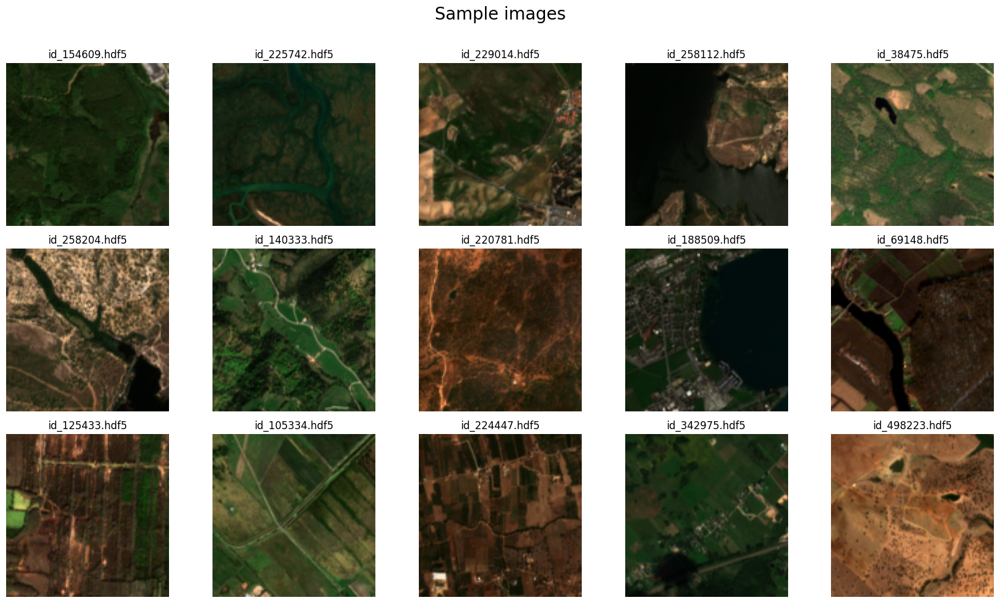

In [ ]:
# Visualize sample images
plot_random_images(images_path, 42, ["04 - Red", "03 - Green", "02 - Blue"], bigearthnet_labels)

In [ ]:
sampled_df = test_df_bigearthnet.sample(n=6, random_state = 42)
labels = list(sampled_df.labels)
sampled_df

,image_id,filename,bands,split,labels,ground_truth_binary_vector
521,id_459540,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Broad-leaved forest, Discontinuous urban fabr...","[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, ..."
737,id_488641,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Complex cultivation patterns, Discontinuous u...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, ..."
740,id_472936,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Complex cultivation patterns, Discontinuous u...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, ..."
660,id_433681,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Bare rock, Sea and ocean]","[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
411,id_428745,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Broad-leaved forest, Complex cultivation patt...","[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, ..."
678,id_497153,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Agro-forestry areas, Broad-leaved forest, Non...","[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
test_df_bigearthnet[test_df_bigearthnet["image_id"] == "id_502503"]

,image_id,filename,bands,split,labels,ground_truth_binary_vector
334,id_502503,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Coastal lagoons, Intertidal flats, Salt marshes]","[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
test_df_bigearthnet[test_df_bigearthnet["image_id"] == "id_433681"]

,image_id,filename,bands,split,labels,ground_truth_binary_vector
660,id_433681,/content/drive/MyDrive/Thesis CLIP4EO/GEO-Benc...,12,test,"[Bare rock, Sea and ocean]","[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


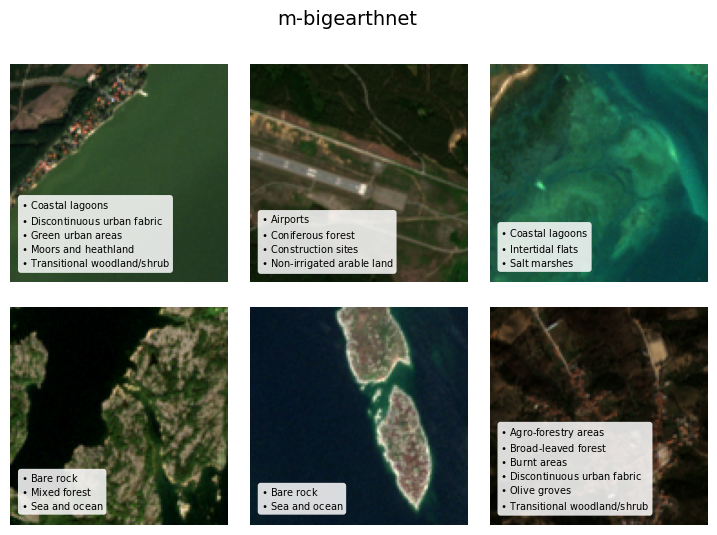

In [40]:
''' Visualizing all images belonging to specific label.
    - rgb_bands have the default name unless specified differently '''

def normalize(img):

    ''' Normalize images for display -> all values in [0, 1]. '''

    return (img - np.min(img)) / (np.max(img) - np.min(img))


rgb_bands = ["04 - Red", "03 - Green", "02 - Blue"]


sampled_df = test_df_bigearthnet.sample(n = 6, random_state = 43)

# sampled_df.loc[sampled_df["image_id"] == "id_507733"] = test_df_bigearthnet[test_df_bigearthnet["image_id"] == "id_502503"].iloc[0]
# sampled_df.loc[sampled_df["image_id"] == "id_503627"] = test_df_bigearthnet[test_df_bigearthnet["image_id"] == "id_433681"].iloc[0]
sampled_df.iloc[2] = test_df_bigearthnet.iloc[334]
sampled_df.iloc[4] = test_df_bigearthnet.iloc[660]

labels = list(sampled_df.labels)


fig, axes = plt.subplots(2, 3, figsize = (9, 6))
axes = axes.flatten()
for i, image_filename in enumerate(sampled_df.filename.tolist()):
    #filename = os.path.join(images_path, image_id + '.hdf5')
    with h5py.File(image_filename, 'r') as f:
        r = f[rgb_bands[0]][:]
        g = f[rgb_bands[1]][:]
        b = f[rgb_bands[2]][:]
        true_color = np.stack([r, g, b], axis=-1)
    true_color = normalize(true_color)
    axes[i].imshow(true_color)
    axes[i].axis("off")

    # Draw label box (upper left corner)
    axes[i].text(
        0.05, 0.07,  # relative position inside axes
        "\n".join([r"$\bullet$ " + label for label in labels[i]]),
        transform= axes[i].transAxes,
        fontsize=7,
        color='black',
        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round, pad=0.3', alpha=0.85), # background box
        # alpha is for transparency, 0 fully transparent and 1 fully opaque
    )

# Hide unused axes (if any)
for i in range(len(labels), len(axes)):
    axes[i].axis('off')

plt.suptitle("m-bigearthnet", fontsize=14)
plt.subplots_adjust(top=0.9, wspace=0.1, hspace=0.05)
#plt.subplots_adjust(wspace=0.1, hspace=0.05)
#plt.tight_layout() #rect=[0, 0, 1, 0.93]
plt.savefig("/content/drive/MyDrive/Thesis CLIP4EO/img/m-bigearthnet_image_grid.png")
plt.show()

Visualizing a sample image in true color and two color composites:
- The True Color composite reflects the way the human eye sees the world. It includes the bands R, G, B;
- The Color Infrared false color composite is mostly useful for monitoring changes in plant health. Denser plant growth is darker red. Cities and exposed ground are gray or tan, and water appears blue or black. It includes the bands NIR, Red and Green;
- The Agriculture RGB false color composite is mostly used to monitor crop health, as both short-wave and near infrared bands are particularly good at highlighting dense vegetation, which appears dark green in the composite. It includes the bands SWIR-1, NIR and Blue.

Sentinel 2 composites: https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/composites/


Sample image: id_46052.hdf5 



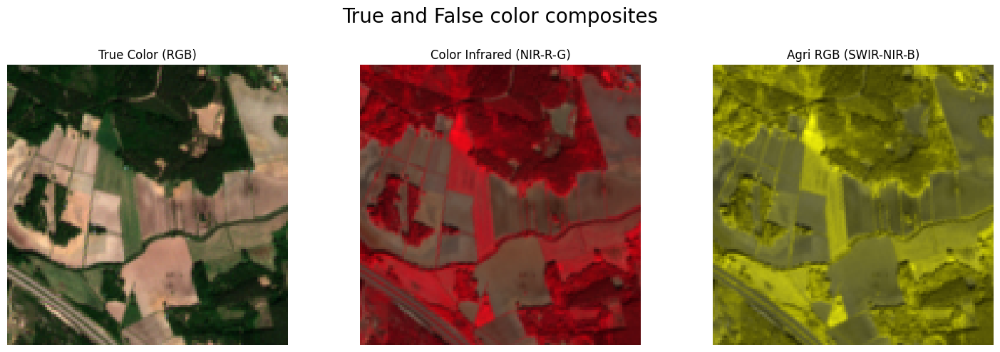

In [ ]:
# Show the image
print("\nSample image:", image_id, "\n")
plot_true_vs_false_composite_image(f)

Let's also have a look at all the bands contained in the image, independently:

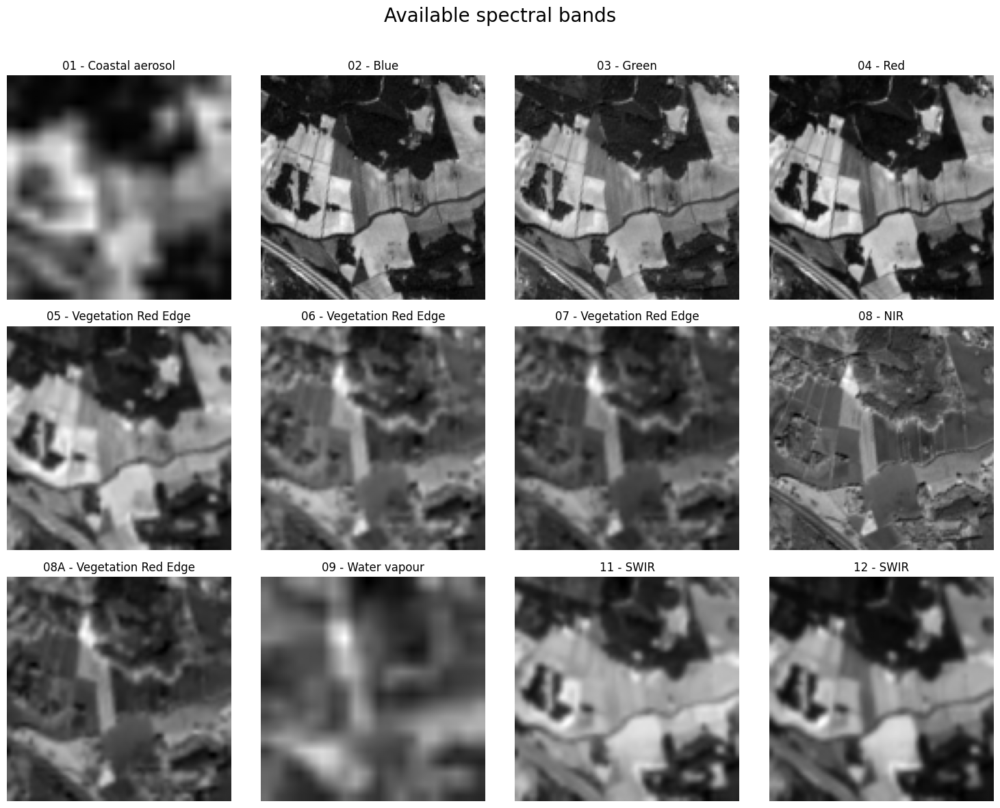

In [ ]:
# Visualize separately all the bands present in the image file
plot_all_bands(f)

In [ ]:
# Checking metadata files
[f for f in os.listdir(images_path) if '.hdf5' not in f]

['0.50x_train_partition.json',
 'LICENSE',
 '0.01x_train_partition.json',
 '0.20x_train_partition.json',
 'default_partition.json',
 '0.02x_train_partition.json',
 'band_stats.json',
 'README',
 '0.05x_train_partition.json',
 'task_specs.pkl',
 '0.10x_train_partition.json',
 'label_stats.json',
 '1.00x_train_partition.json']

In [ ]:
# Load the labels for all data samples
with open(os.path.join(images_path, 'label_stats.json'), 'r') as file:
    labels = json.load(file)

# Labels associated to sample image
print(len(labels[image_id[:-5]]))
labels[image_id[:-5]] # remove '.hdf5' from id

43


[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

Sample image: id_46052.hdf5 



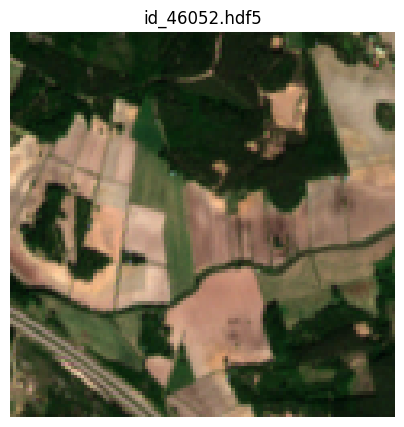


Labels:

- Coniferous forest
- Land principally occupied by agriculture, with significant areas of natural vegetation
- Mixed forest
- Non-irrigated arable land
- Road and rail networks and associated land


In [ ]:
# Get image labels
image_labels = labels[image_id[:-5]]

# Plot image and associated labels
def plot_with_labels(image_id):

    print("Sample image:", image_id, "\n")

    true_color_bands = ("04 - Red", "03 - Green", "02 - Blue")

    filename  = os.path.join(images_path, image_id)

    with h5py.File(filename, "r") as f:
        # Load True Color (R-G-B)
        r = f[true_color_bands[0]][:]
        g = f[true_color_bands[1]][:]
        b = f[true_color_bands[2]][:]
        true_color = np.stack([r, g, b], axis = -1)

    true_color = normalize(true_color)

    fig = plt.figure(figsize = (5, 5))
    plt.imshow(true_color)
    plt.title(filename.split('/')[-1])
    plt.axis("off")
    plt.show()

    print("\nLabels:\n")

    for l in [label for boolean, label in zip(image_labels, bigearthnet_labels) if boolean]:
        print('-', l)

    return

#image_ids = ['id_46052.hdf5', 'id_215171.hdf5',  'id_232175.hdf5']
plot_with_labels(image_id)

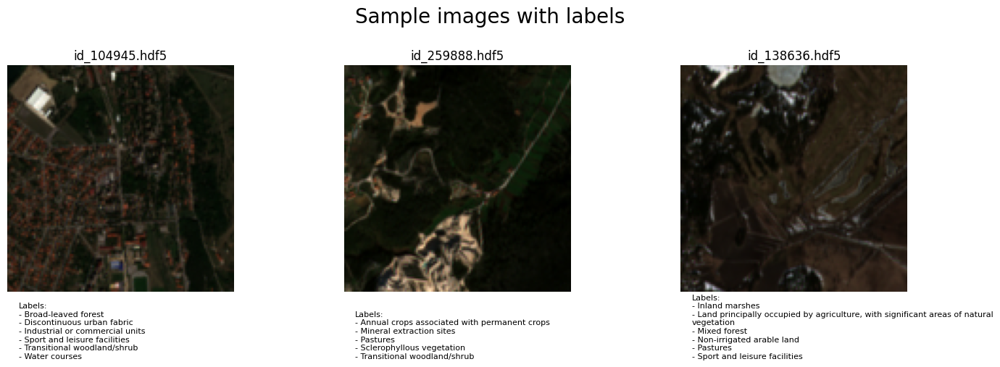

In [ ]:
plot_images_multilabel(images_path, 0, labels, bigearthnet_labels)

Let's check the distribution of labels per image:

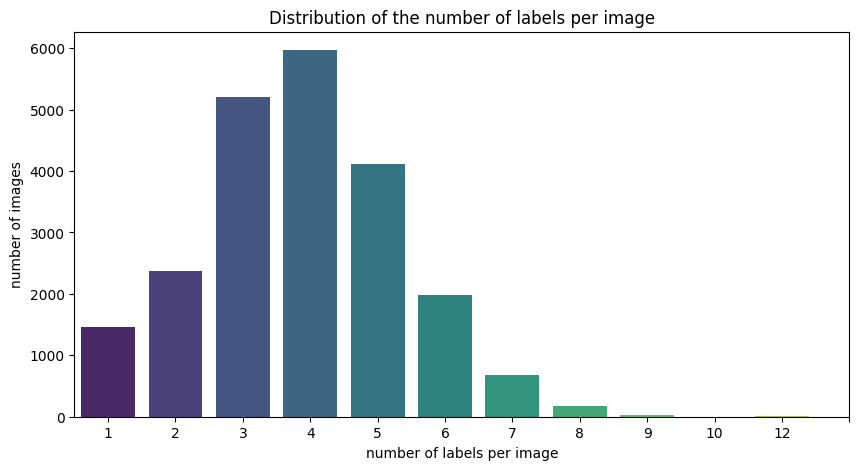


Statistics:

       Number of labels
count      22000.000000
mean           3.845500
std            1.494506
min            1.000000
25%            3.000000
50%            4.000000
75%            5.000000
max           12.000000


In [ ]:
# Count number of (positive) labels per image
n_labels = [sum(l) for l in labels.values()]

# Create a frequency count of the occurrences
n_labels_df = pd.DataFrame({'Number of labels': n_labels})
count_distribution = n_labels_df['Number of labels'].value_counts().sort_index()

# Barplot
plt.figure(figsize = (10, 5))
sns.barplot(x = count_distribution.index, y = count_distribution.values, palette = 'viridis')

plt.xlabel("number of labels per image")
plt.ylabel("number of images")
plt.title("Distribution of the number of labels per image")
plt.xticks(range(0, max(n_labels)))
plt.show()

# Summary statistics
print("\nStatistics:\n")
print(n_labels_df.describe())

In [ ]:
count_distribution

,Number of labels
1,1467
2,2376
3,5207
4,5968
5,4116
6,1989
7,681
8,169
9,22
10,1


In [ ]:
all(len(labels[key])==43 for key in labels.keys())

True

> matplotlib/seaborn colors: https://matplotlib.org/stable/gallery/color/named_colors.html

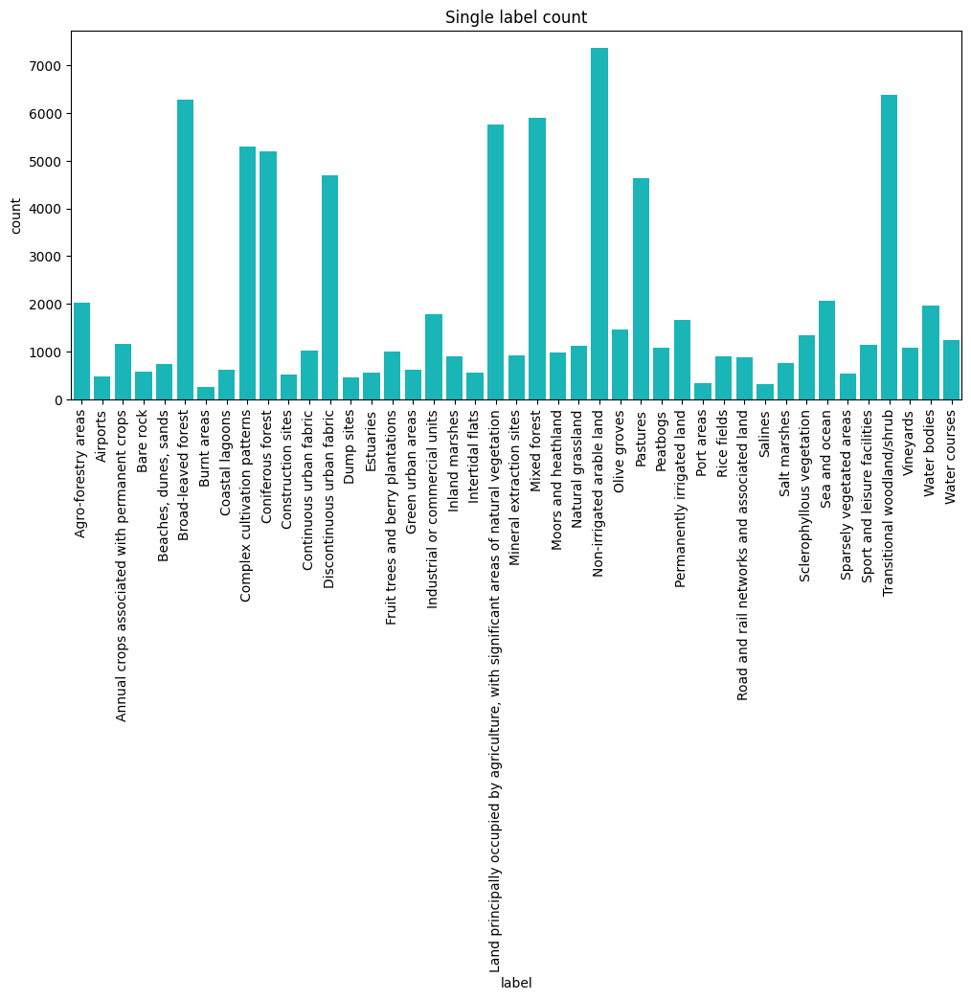

In [ ]:
# Convert to numpy array for easier summation
label_matrix = np.array(list(labels.values()))  # Shape: (num_samples, 43)

# Count the number of times each label is positive
positive_per_label = np.sum(label_matrix, axis=0)

# Barplot
plt.figure(figsize=(12, 5))
sns.barplot(x = bigearthnet_labels, y = positive_per_label, color = "darkturquoise")

plt.xlabel("label")
plt.ylabel("count")
plt.title("Single label count")
plt.xticks(rotation = 90)
plt.show()